### LOAD PACKAGES 

In [1]:
# Importation des librairies 

import pandas as pd 
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import collections
import time

from sklearn.cluster import KMeans
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix
from imblearn.under_sampling import RandomUnderSampler 
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.metrics import roc_auc_score
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import f1_score,classification_report,roc_auc_score,precision_score,recall_score, precision_recall_fscore_support 
from sklearn.model_selection import GridSearchCV,train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn_som.som import SOM
#from sklearn_som.unsupervised_alt import silouhette


pd.set_option('display.max_columns', 100)

### READ THE DATA 

In [2]:
# Lire la data stockée dans le fichier CSV. Modifier le chemin si vous relancer le kernel 
#df=pd.read_csv(r'C:\Users\anas.sory\Documents\Stage\creditcard.csv')
#train_df=pd.read_csv(r'C:\Users\MohamedAliELBOURI\Desktop\Projet\fraude-main\fraude-main\Data\archive fraude CB7\fraudTrain.csv')
#test_df=pd.read_csv(r'C:\Users\MohamedAliELBOURI\Desktop\Projet\fraude-main\fraude-main\Data\archive fraude CB7\fraudTest.csv')
import os
data_file= os.path.abspath('../../data')
full_path=data_file+'\\'+'fraudTrain.csv'
train_df=pd.read_csv(full_path)
full_path=data_file+'\\'+'fraudTest.csv'
test_df=pd.read_csv(full_path)

full_path=data_file+'\\'+'X_train_1_2_svm.csv'
xtrain_transformed_complique=pd.read_csv(full_path)
ytrain_transformed_complique=train_df['is_fraud'].iloc[:int(len(train_df)*0.8)]

full_path=data_file+'\\'+'X_test_1_2_svm.csv'
xtest_transformed_complique=pd.read_csv(full_path)
ytest_transformed_complique=test_df['is_fraud']

### CHECK THE DATA 

In [3]:
print(ytrain_transformed_complique.shape)
print(xtrain_transformed_complique.shape)

(1037340,)
(1037340, 32)


In [4]:
print("Credit Card Fraud Detection data -  rows:",train_df.shape[0]," columns:", train_df.shape[1])

Credit Card Fraud Detection data -  rows: 1296675  columns: 23


### Preparing and splitting the data

In [5]:
cols = train_df.columns.tolist()
cols = [c for c in cols if c not in ["is_fraud"]]
target = "is_fraud"
print(cols)

#Definition des nouvelles variables X_train and Y_train
X_train = train_df[cols]
Y_train = train_df[target]

#Definition des nouvelles variables X_test and Y_test
X_test = test_df[cols]
Y_test = test_df[target]

print(X_train.shape)
print(Y_train.shape)
print(X_test.shape)
print(Y_test.shape)


['Unnamed: 0', 'trans_date_trans_time', 'cc_num', 'merchant', 'category', 'amt', 'first', 'last', 'gender', 'street', 'city', 'state', 'zip', 'lat', 'long', 'city_pop', 'job', 'dob', 'trans_num', 'unix_time', 'merch_lat', 'merch_long']
(1296675, 22)
(1296675,)
(555719, 22)
(555719,)


### Clustering Original data and finding outliers (with feature selection)

#### Preprocessing the data

In [6]:
# Defining selected features
features = [ 'category', 'gender', 'dob', 'city_pop', 'zip', 'amt', 'unix_time']
 #job contains unkonwn values in test
 #merchant and state too many values

X_train = X_train[features]
X_test = X_test[features]



In [7]:
# Inspecting categorical variables
#for col in X_train.columns:
#    if X_train[col].dtype == 'object':
#        print("-------------------------------------")
#        print(col)
#        print(np.unique(X_train[col].astype(str)))

In [8]:
category_to_label = {'misc_net' : 0, 'shopping_net' : 0, 'grocery_net' : 0,
                 'entertainment' : 1, 'personal_care' : 1, 'travel' : 1, 'shopping_pos':1,
                  'health_fitness' : 2, 'food_dining' : 2, 'misc_pos' : 2,
                    'gas_transport' : 3, 'grocery_pos' : 3, 'home' : 3, 'kids_pets' : 3
}
# 0 net
# 1 non essential
# 2 semi essential
# 3 essential 
categories = np.unique(X_train['category'].astype(str))
replace_list = [category_to_label[cat] for cat in categories]
X_train_transformed = X_train.copy()
X_test_transformed = X_test.copy()
X_train_transformed['category'] = X_train['category'].replace(categories, replace_list)
X_test_transformed['category'] = X_test['category'].replace(categories, replace_list)

# Convert gender to binary
X_train_transformed['gender'] = X_train['gender'].replace(['M','F'], [0,1])
X_test_transformed['gender'] = X_test['gender'].replace(['M','F'], [0,1])

# Define age
from datetime import date
from datetime import datetime

def calculateAge(birthDate):
    birthDate = datetime.strptime(birthDate, '%Y-%m-%d').date()
    today = date.today()
    age = today.year - birthDate.year - ((today.month, today.day) <(birthDate.month, birthDate.day))
    return age

X_train_transformed['dob'] = X_train_transformed['dob'].apply(calculateAge)
X_test_transformed['dob'] = X_test_transformed['dob'].apply(calculateAge)

In [9]:
# Scaling the data
columns = X_train_transformed.columns
print(type(X_train_transformed))
scaler = StandardScaler()
scaler.fit(X_train_transformed)
X_train_transformed= scaler.transform(X_train_transformed)
X_test_transformed = scaler.transform(X_test_transformed)
print(type(X_train_transformed))
print(X_train_transformed.dtype)

<class 'pandas.core.frame.DataFrame'>
<class 'numpy.ndarray'>
float64


#### making my first SelfOrganizingMaping

In [10]:
# declaration des variables
largeur=9
longueure=9
nombre_de_models= 50#50  = 5h d'executions min
# je met les indices dans x et y pour l'affichage

tab_nb_fraud=dict()
percent=dict()
if 'saving' not in globals():#deprecated
    saving=[]
if 'saving_train' not in globals():
    saving_train=[]
if 'saving_test' not in globals():
    saving_test=[]
if 'predictions' not in globals():
    predictions=np.ndarray(shape=(largeur*longueure,), dtype=np.int64, order='F')

x=np.arange(0,longueure)
y=np.arange(0,largeur)
z=np.zeros(largeur*longueure)

In [11]:

#return tab_nb_fraud qui contien le nombre de fraudes de chaques clusters
# par exemple tab_nb_fraud[0] = [12377  320]
    #tab_nb_fraud=dict()
def generate_nb_fraud_train(tab_nb_fraud ,predictions ,Y_train):
    index=0
    for key in tab_nb_fraud.keys():
        tab_nb_fraud[key]=[0,0]
    while index < len(Y_train):
        if predictions[index] not in tab_nb_fraud.keys():
            tab_nb_fraud[predictions[index]]=[0,0]
        if Y_train[index]==1:
            # prediction[25]= 2 ---> la donnée 25 est dans le cluster2
            tab_nb_fraud[ predictions[index]][1] =1+tab_nb_fraud[ predictions[index]][1]
        else:
            tab_nb_fraud[ predictions[index]][0] =1+tab_nb_fraud[ predictions[index]][0]
        index=index+1
    drop = []
    for key in tab_nb_fraud.keys():
        if tab_nb_fraud[key]==[0,0]:
            drop.append(key)
    for drop_i in drop:
        del(tab_nb_fraud[drop_i])
        
def generate_nb_fraud_test(tab_nb_fraud ,predictions ,Y_test):
    index=0
    for key in tab_nb_fraud.keys():# reset tab_fraud
        tab_nb_fraud[key]=[0,0]
        
    while index < len(Y_test):
        if predictions[index] not in tab_nb_fraud.keys():
            tab_nb_fraud[predictions[index]]=[0,0]
        if Y_test[index]==1:
            tab_nb_fraud[ predictions[index]][1] =1+tab_nb_fraud[ predictions[index]][1]
        else:
            tab_nb_fraud[ predictions[index]][0] =1+tab_nb_fraud[ predictions[index]][0]
        index=index+1
        
    drop = []
    for key in tab_nb_fraud.keys():
        if tab_nb_fraud[key]==[0,0]:
            drop.append(key)
    for drop_i in drop:
        del(tab_nb_fraud[drop_i])

            
# return le pourcentage de fraudes de chaques clusters
def generate_percent(percent,tab_nb_fraud):
    for cluster in tab_nb_fraud:
        percent[cluster]= tab_nb_fraud[cluster][1]/(tab_nb_fraud[cluster][0]+tab_nb_fraud[cluster][1])

# savve le percent de chaque data dans saving_tab= on oublie le cluster 
def save(saving_tab,predictions,percent):
    #print("prediction_id = ",id(predictions)," prediction_size ",size)
    #print("percent_id    = ",id(percent))
    size=len(predictions)
    une_iteration=[]
    i=0
    non_classifié=0
    while i < size:
        #predictions[i]= le numero du cluster le la donnée i
        #percent[i]= le pourcent du cluster i
        if( predictions[i] in percent.keys()):
            une_iteration.append( percent[ predictions[i] ]  )
        else:
            une_iteration.append(-1) 
            non_classifié=non_classifié+1
        i=i+1
    saving_tab.append(list(une_iteration))
    if(non_classifié >0):
        print(str(non_classifié)+" element on été classé dans un cluster qui etait vide dans train")
        
    
def moyenne(saved_percent_tab,nombre_de_models):#renvoie une liste qui est la moyenne de saving
    moyenne=[]
    numero_data=0
    big_number=len(saved_percent_tab[0])
    
    while(numero_data<big_number):
        iteraton_actuelle=0
        summ=0
        while (iteraton_actuelle< nombre_de_models):
            if(saved_percent_tab[iteraton_actuelle][numero_data] != -1):
                summ=summ+saved_percent_tab[iteraton_actuelle][numero_data]
            iteraton_actuelle=iteraton_actuelle+1
        summ=summ/nombre_de_models
        moyenne.append(summ)
        numero_data=numero_data+1
    return moyenne
      

def affiche(z,title="mass"):
    z_local=z[:]
    z_local[:] = [x if x != -1 else 0 for x in z_local]
    fig = plt.figure(figsize=(8,8),dpi=80)#ecrit gros pour pouvoir lire
    ax = fig.add_subplot(projection='3d')
    
    ax.set_title(title,fontsize=16,loc='left')
    hist, xedges, yedges = np.histogram2d(x, y, bins=largeur, range=[[0,largeur ], [0, longueure]])

    # Construct arrays for the anchor positions of the bars.
    xpos, ypos = np.meshgrid(xedges[:-1] , yedges[:-1], indexing="ij")
    xpos = xpos.ravel()
    ypos = ypos.ravel()
    zpos = 0

    # Construct arrays with the dimensions for the bars.
    dx = dy = 0.5 * np.ones_like(zpos)
    ax.bar3d(xpos, ypos, zpos, dx, dy, z_local, zsort='average')
    plt.show()

    
def affiche_moyenne(saved_percent_tab,nombre_de_models,label='some numbers'):
    #moy=sorted(moyenne(),reverse=True)
    moy=sorted(moyenne(saved_percent_tab,nombre_de_models),reverse=True)
    
    plt.plot(moy)
    plt.ylabel(label)
    plt.show()
    i=0
    while(i<len(moy)):
        if(moy[i] < 0.20):
            print(str(i)+" values above 20% ")
            break
        i=i+1
    while(i<len(moy)):
        if(moy[i] < 0.05):
            print(str(i)+" values above 5% ")
            break
        i=i+1
    while(i<len(moy)):
        if(moy[i] < 0.02):
            print(str(i)+" values above 2% ")
            break
        i=i+1

        
### from 400 to 20 20
def convert_base(val,base):
    unite=val%base
    dizaine = (val-unite)/base 
    return dizaine,unite

def best_cluster(tab_nb_fraud, mass_min=1000):# renvie le numero du meilleur cluster
    best_cluster=0
    best_percent=0
    current_percent=best_percent
    for cluster in tab_nb_fraud:# seulement les cluster de taille 1000 sont ecouté
        if(tab_nb_fraud[cluster][1]+tab_nb_fraud[cluster][0]>mass_min):
            current_percent= tab_nb_fraud[cluster][1]/(tab_nb_fraud[cluster][0]+tab_nb_fraud[cluster][0])
            if (current_percent>best_percent):
                best_percent=current_percent
                best_cluster=cluster
    
    return best_cluster


# il y a beaucoup a changer ici
# il faut renvoyer les clusters avec les infos importantes
# cet a dire le pourcent du cluster et les data qui sont dedan
# forme attendue [[0.56][52 125 ... 54545 77455]]  [[0.06][99 155 ... 54555 15455]]
def probably_10_best_clusters(mass_min=1000):# renvie le numero du meilleur cluster
    best_clusters=[]
    cluster=[0,0] #doit contenir [percent mass]
    moy=sorted(moyenne_qui_passe_certaines_saves(),reverse=True)
    current_percent=moy[0]
    cluster[0]=current_percent
    index=0
    clusters_trouvé=1
    while(index <len(moy)):
        if(current_percent==moy[index]):
            cluster[1]= cluster[1]+1
        else:#j'ai trouve un nouveau cluster
            best_clusters.append(cluster[:])
            current_percent=moy[index]
            cluster[0]=current_percent
            cluster[1]=1
            clusters_trouvé=clusters_trouvé+1
        
        if (clusters_trouvé>10):
            index=len(moy)+1
        index=index+1    
    return best_clusters
   

    
def reset(liste_non_vide):# not tested
    liste_non_vide[:]=list()


def lisser_small_clusters():# ne marche pas 
    average=sum(percent.values())/len(percent)
    for cluster in percent:#haut percent et peut de data
        if (percent[cluster] >0.10)and(tab_nb_fraud[cluster][1]+tab_nb_fraud[cluster][0]<1000):
            print ("faux cluster trouvé")
            percent[cluster]=average
    print (percent)



def camembert():
    # n'affiche que le dernier model , mais bon la notion de cluster se perd
    #avec les moyenne , et le camembert n'a plus de sens
    label_pie=[]
    i=0
    while i < largeur*longueure:
        label_pie.append(str(i))
        i=i+1
    plt.pie(np.array(list(tab_nb_fraud.values()))[:,1],labels=tab_nb_fraud.keys(),normalize=True)
    plt.figure(figsize = (8, 8))
    plt.plot()
    plt.pie(percent.values(),labels=percent.keys(),normalize=True)
    plt.figure()

    
    

In [12]:
def silhouette_score(fitted_som,data):
    dist_tab=fitted_som.transform(data)

def execution_SOM(saving_train,saving_test,Y_train ,Y_test,affichage="all"):
    start = time.time()#
    index =0
    reset(saving_train)
    reset(saving_test)
    tab_nb_fraud=dict()
    percent=dict()
    
    while (index<nombre_de_models):
        #calcul
        som = SOM(m=largeur, n=longueure, dim=7,max_iter=100000)# , max_iter = 1)
        som.fit(X_train_transformed, epochs =200)
        print("---training = %s seconds ---" % (time.time() - start));start = time.time() # 14 min expected
        predictions = som.predict(X_train_transformed)
        print("---predictions_train %s seconds ---" % (time.time() - start));start = time.time() # 14 min expected
        #sauvgarder les resultats
        
        generate_nb_fraud_train(tab_nb_fraud ,predictions ,Y_train)
        generate_percent(percent,tab_nb_fraud)
        save(saving_train,predictions,percent)
        #afficher
        if(affichage=="all" or affichage=="only_train"):
            print("-----------------------------------------------------------")
            print("-----------------------------------------------------------")
            print("-----------------------------------------------------------")
            print("best_cluster train ="+str(best_cluster(tab_nb_fraud)))
            z[list(percent.keys())] = list(percent.values())
            affiche(z,"train_percent")
            z[list(tab_nb_fraud.keys())] = list(np.array(list(tab_nb_fraud.values()))[:,1])
            affiche(z,"train_mass")


        #essai sur test
            #j'associe un cluster a chaque data
        predictions = som.predict(X_test_transformed)
        print("---predictions_test %s seconds ---" % (time.time() - start));start = time.time() # 14 min expected

        if(affichage=="all"):
            generate_nb_fraud_test(tab_nb_fraud ,predictions ,Y_test)
        #generate_percent(percent,tab_nb_fraud)
        save(saving_test,predictions,percent)
        #<----- j'enregistre le % du cluster de chaque data 
        # % qui n'a pas été mis a jour donc il s'agit du % de train
        #afficher
        if(affichage=="all"):
            print("best_cluster test ="+str(best_cluster(tab_nb_fraud)))
            z[list(tab_nb_fraud.keys())] = list(np.array(list(tab_nb_fraud.values()))[:,1])
            affiche(z,"test_mass")
        index=index+1
        


In [13]:
som = SOM(m=largeur, n=longueure, dim=7,max_iter=10000)# , max_iter = 1)
som.fit(X_train_transformed, epochs =20000)
predictions = som.predict(X_train_transformed)
dist_tab=som.transform(X_train_transformed)

max_iter atteint


In [14]:
from sklearn import metrics

#6 min par modelles 
# 50 *6 = 60*5 = 5H

In [15]:
start = time.time()#
sil=0
#sil =metrics.silhouette_score(X_train_transformed, predictions, metric='euclidean')
print("---silhouette_score %s seconds ---" % (time.time() - start));start = time.time() # hours expected


---silhouette_score 0.0009980201721191406 seconds ---


In [16]:
print(sil)#epochs = 20000 , max_iter=1000000

0


In [17]:
print(sil)#epochs = 200 , max_iter=100000

0


max_iter atteint
---training = 151.65875005722046 seconds ---
---predictions_train 107.45433282852173 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =76


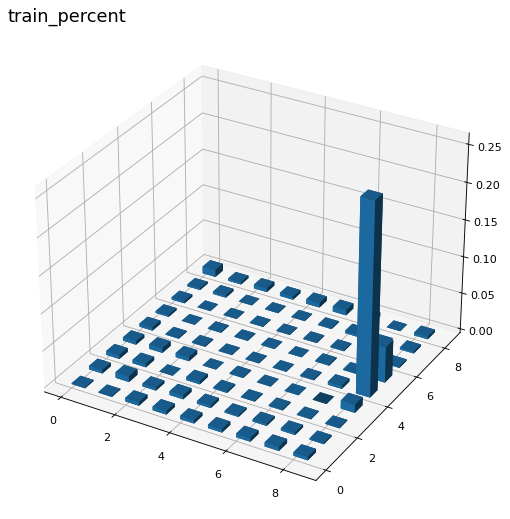

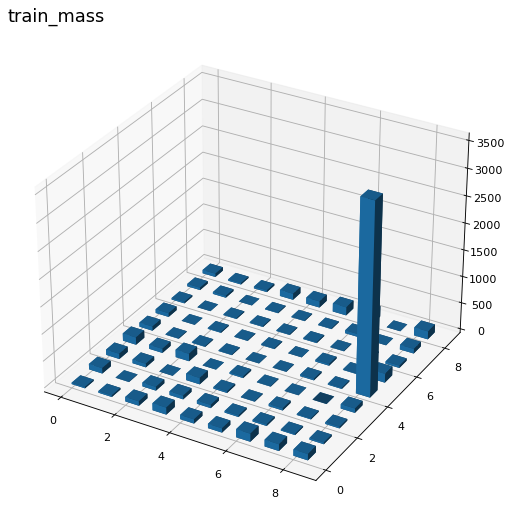

---predictions_test 53.429917097091675 seconds ---
best_cluster test =76


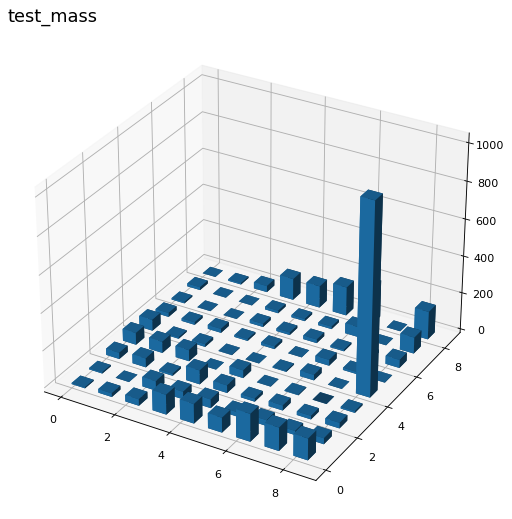

max_iter atteint
---training = 151.50022673606873 seconds ---
---predictions_train 108.89457535743713 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =31


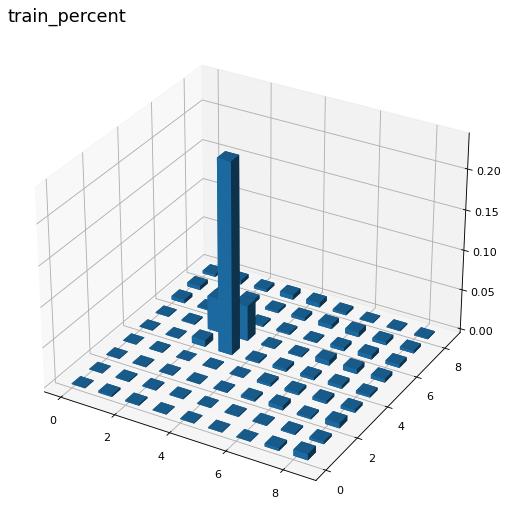

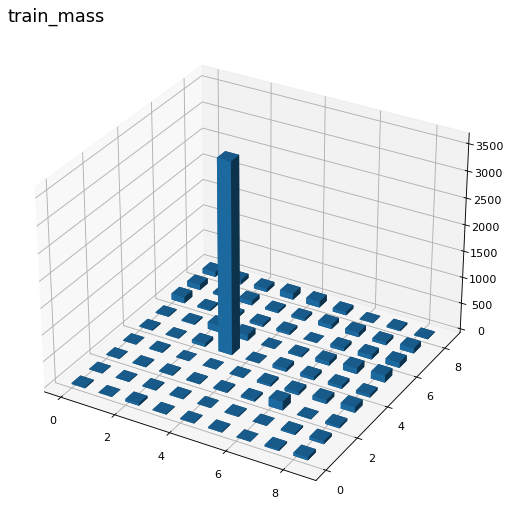

---predictions_test 54.5491087436676 seconds ---
best_cluster test =31


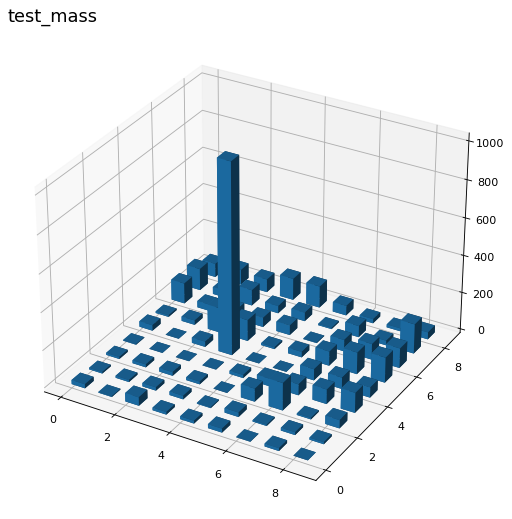

max_iter atteint
---training = 158.42208766937256 seconds ---
---predictions_train 115.78884100914001 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =18


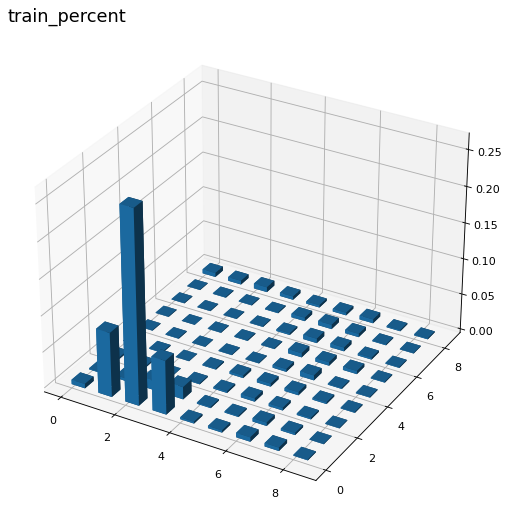

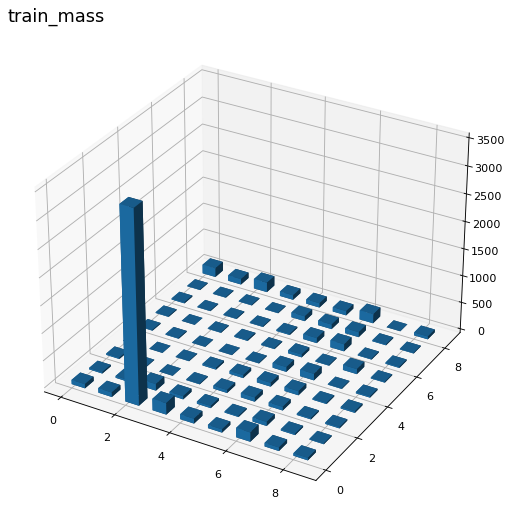

---predictions_test 60.62595272064209 seconds ---
best_cluster test =18


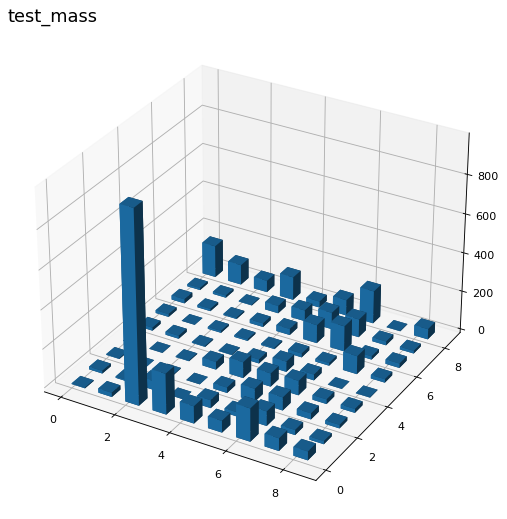

max_iter atteint
---training = 161.3440399169922 seconds ---
---predictions_train 127.4720230102539 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =8


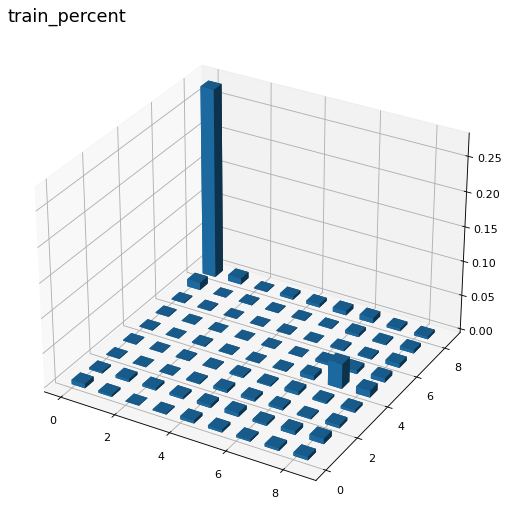

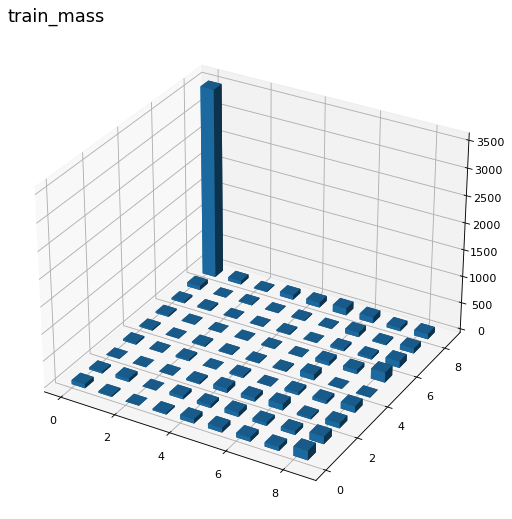

---predictions_test 58.38320803642273 seconds ---
best_cluster test =8


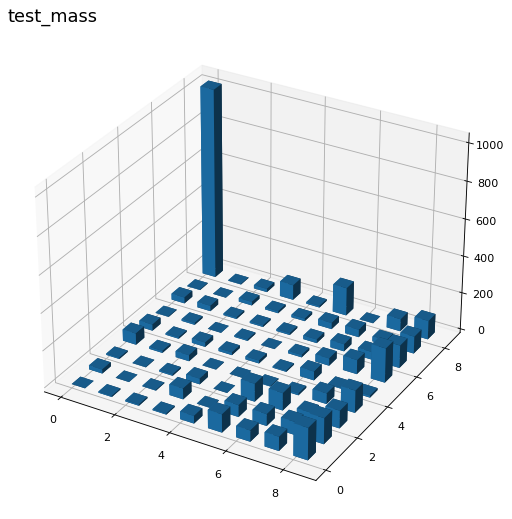

max_iter atteint
---training = 155.57421803474426 seconds ---
---predictions_train 114.57507681846619 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =0


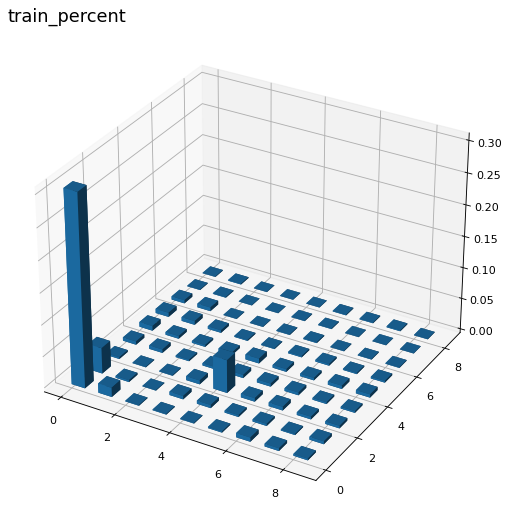

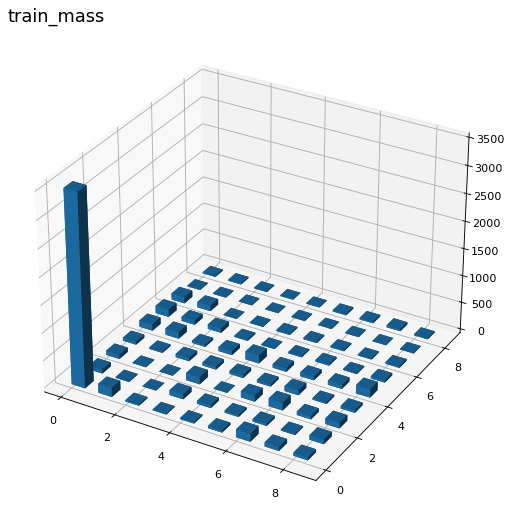

---predictions_test 65.53022241592407 seconds ---
best_cluster test =0


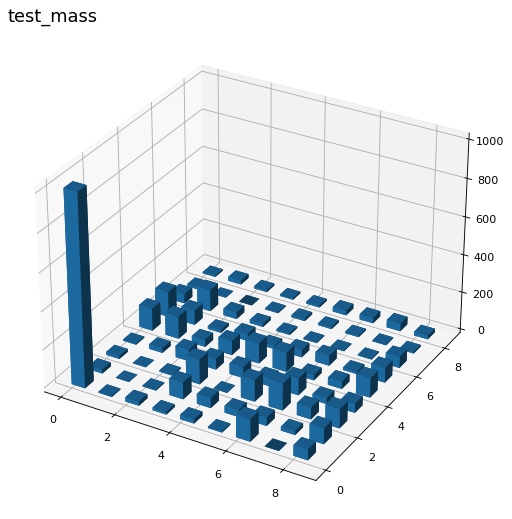

max_iter atteint
---training = 154.3059060573578 seconds ---
---predictions_train 106.94944715499878 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =72


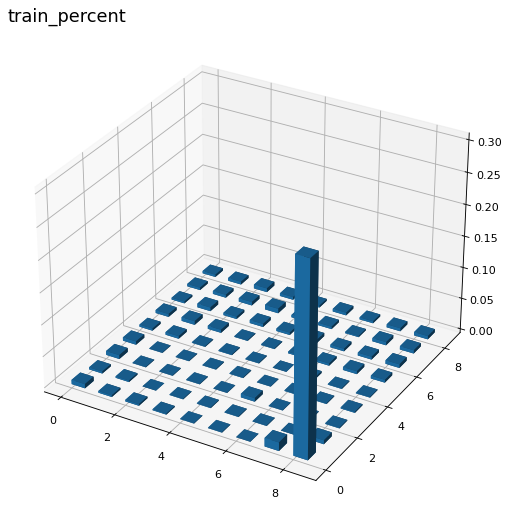

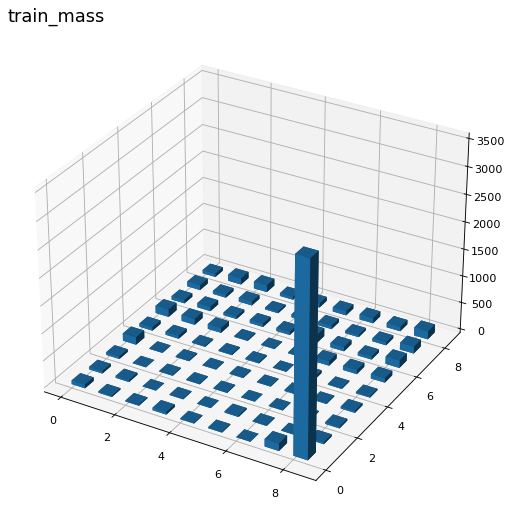

---predictions_test 54.31144070625305 seconds ---
best_cluster test =72


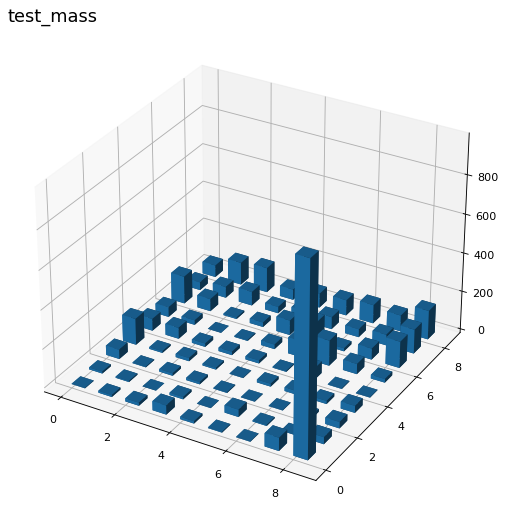

max_iter atteint
---training = 155.0689196586609 seconds ---
---predictions_train 108.42940092086792 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =45


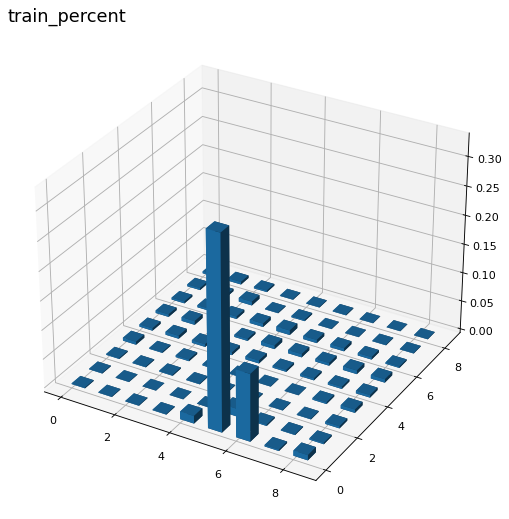

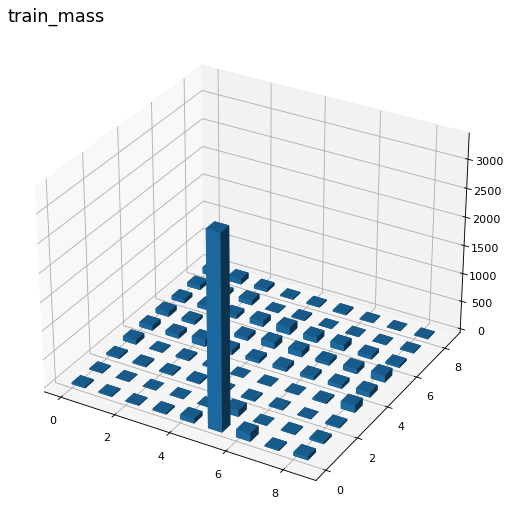

---predictions_test 53.944950342178345 seconds ---
best_cluster test =45


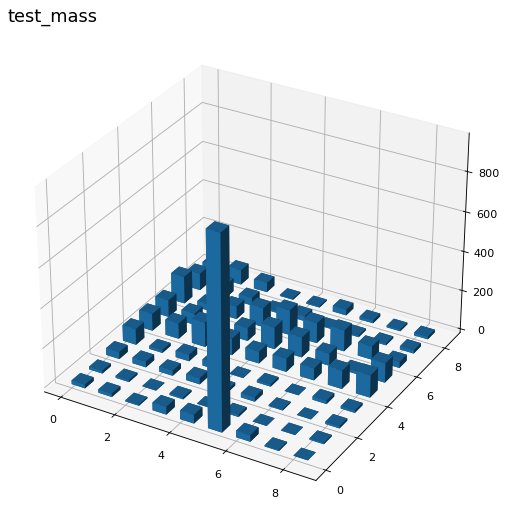

max_iter atteint
---training = 155.06496286392212 seconds ---
---predictions_train 109.0125458240509 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =74


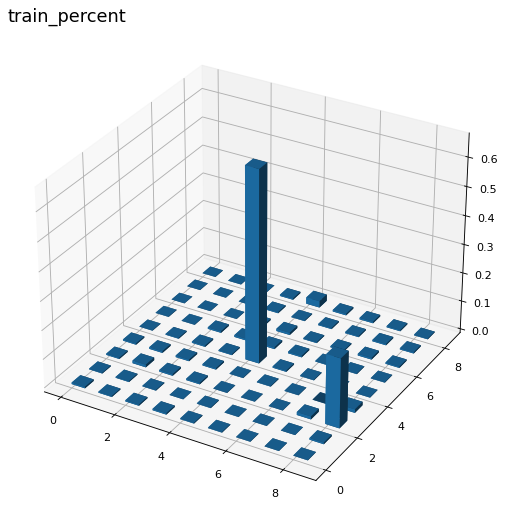

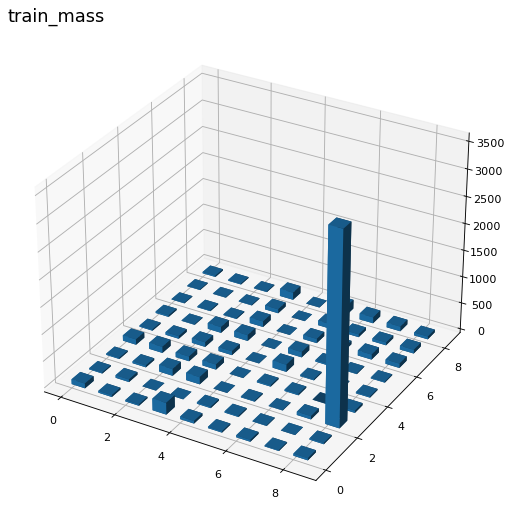

---predictions_test 54.91155242919922 seconds ---
best_cluster test =74


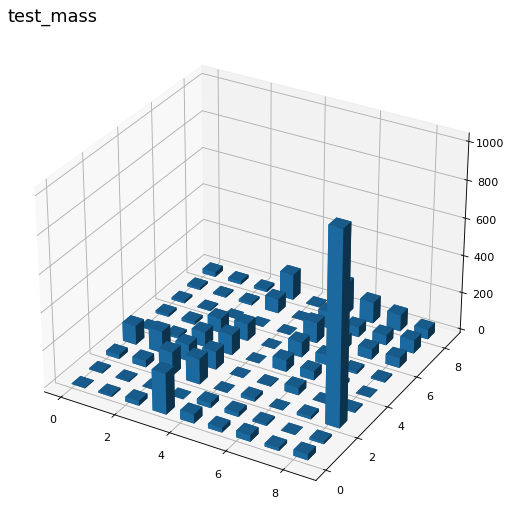

max_iter atteint
---training = 154.0065016746521 seconds ---
---predictions_train 110.64569425582886 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =53


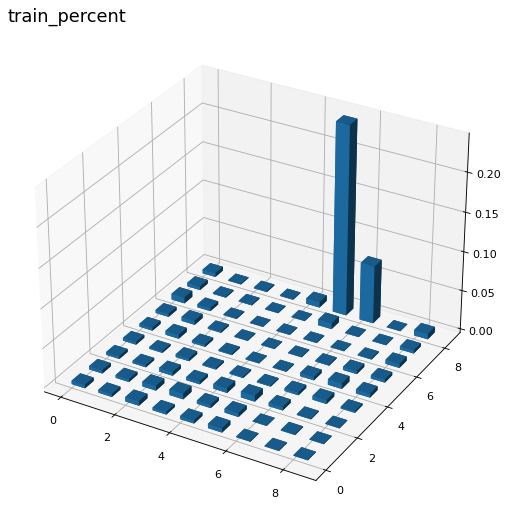

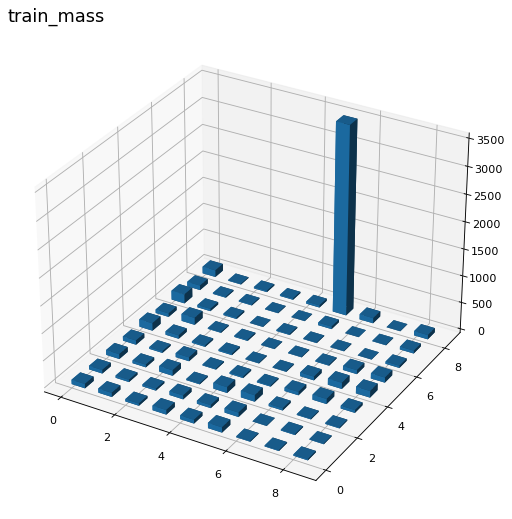

---predictions_test 55.49086856842041 seconds ---
best_cluster test =53


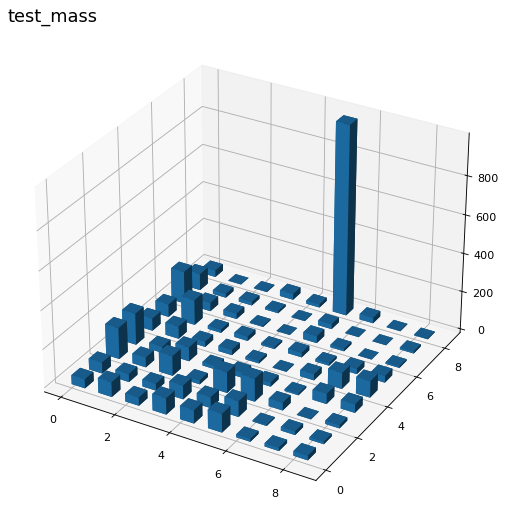

max_iter atteint
---training = 168.7262828350067 seconds ---
---predictions_train 158.7318799495697 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =78


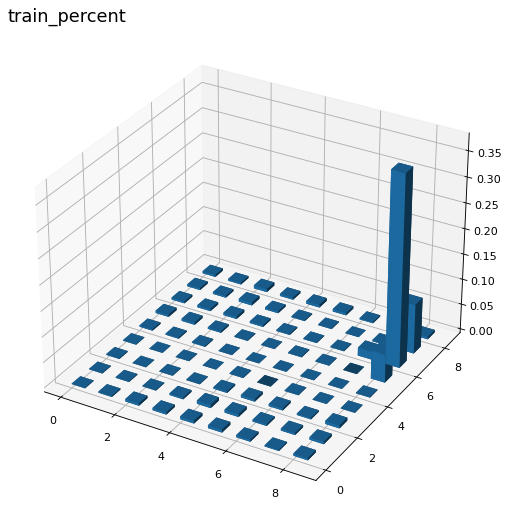

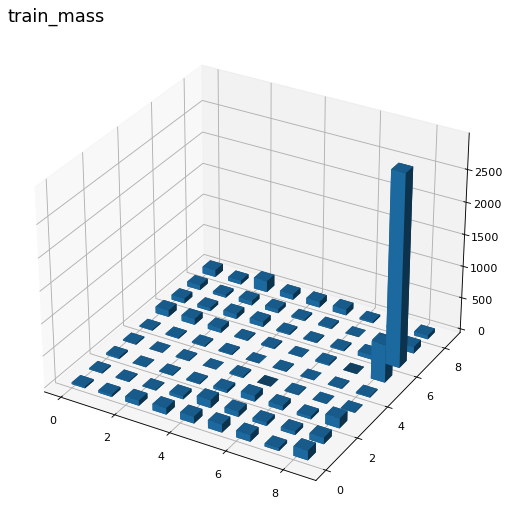

---predictions_test 89.8818724155426 seconds ---
best_cluster test =78


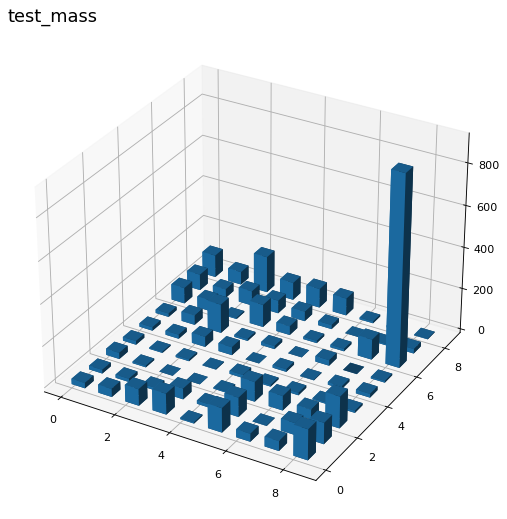

max_iter atteint
---training = 188.32490277290344 seconds ---
---predictions_train 110.81307864189148 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =35


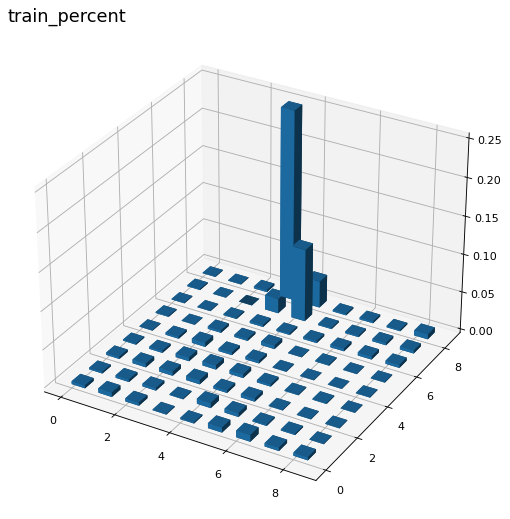

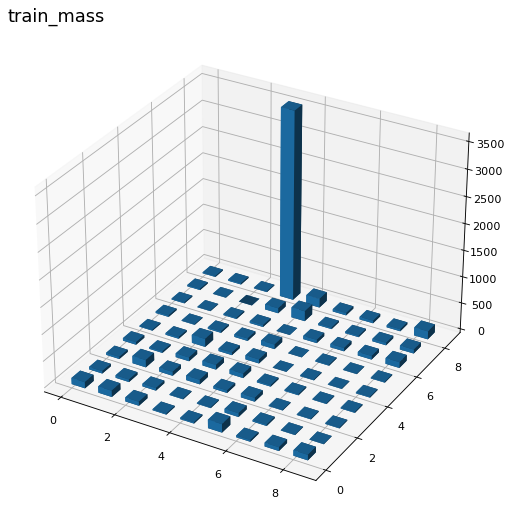

---predictions_test 53.95091271400452 seconds ---
best_cluster test =35


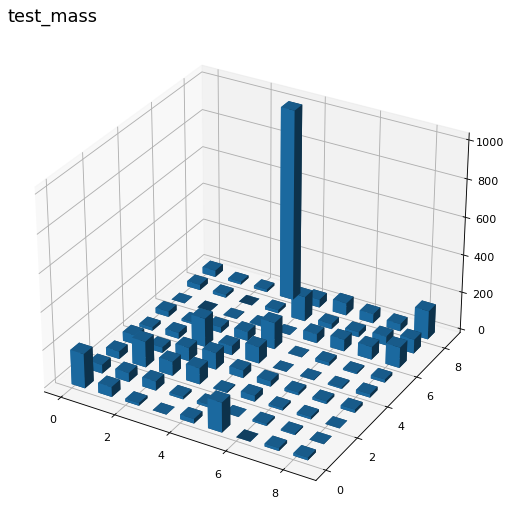

max_iter atteint
---training = 155.3222873210907 seconds ---
---predictions_train 108.44412326812744 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =75


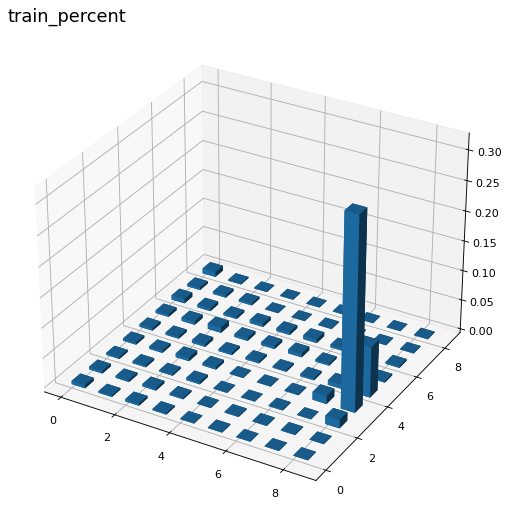

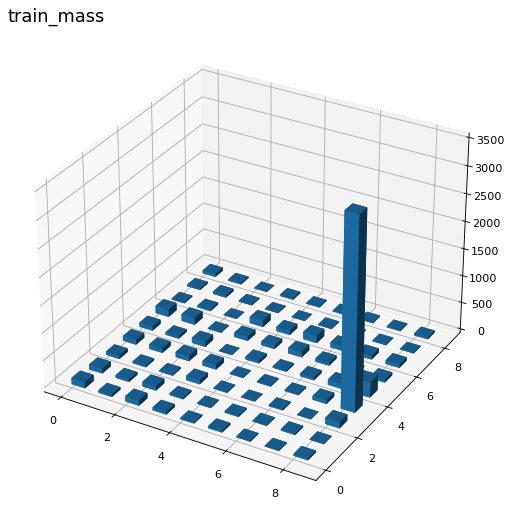

---predictions_test 53.41493344306946 seconds ---
best_cluster test =75


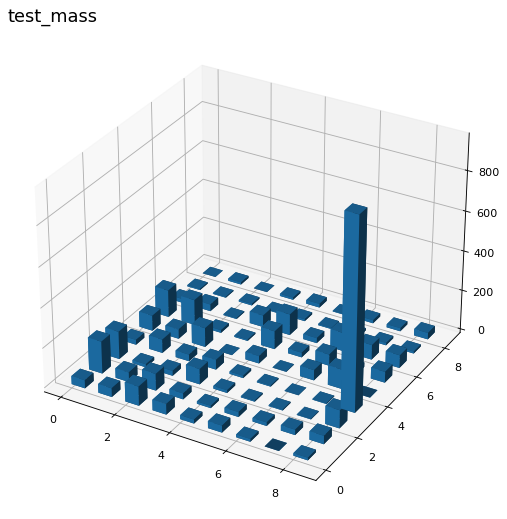

max_iter atteint
---training = 149.85144662857056 seconds ---
---predictions_train 109.81093978881836 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =5


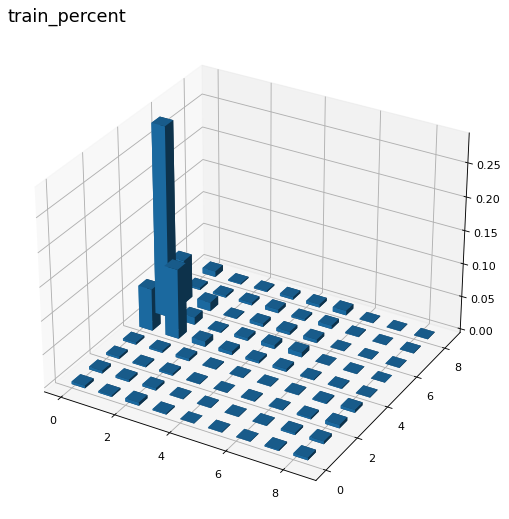

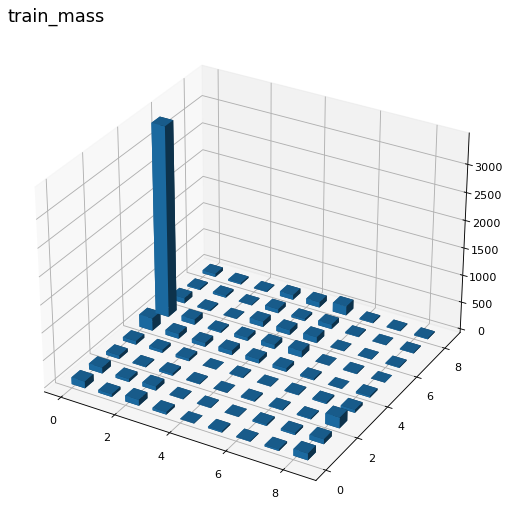

---predictions_test 55.27997803688049 seconds ---
best_cluster test =5


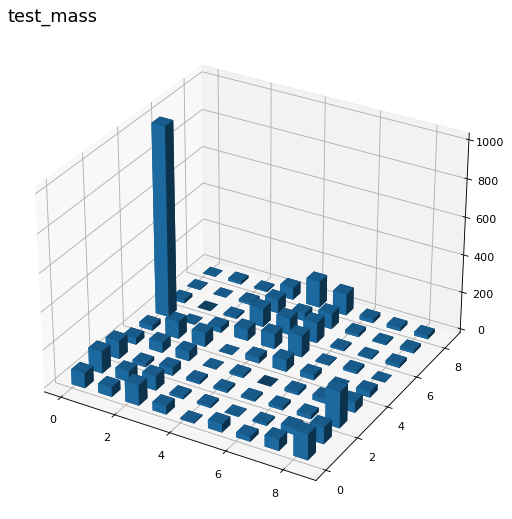

max_iter atteint
---training = 152.517076253891 seconds ---
---predictions_train 110.62107372283936 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =77


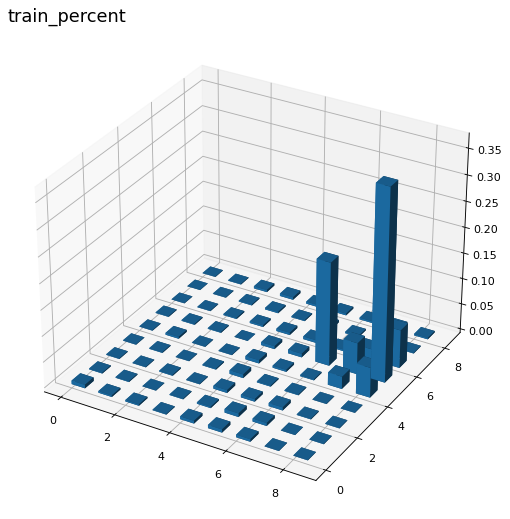

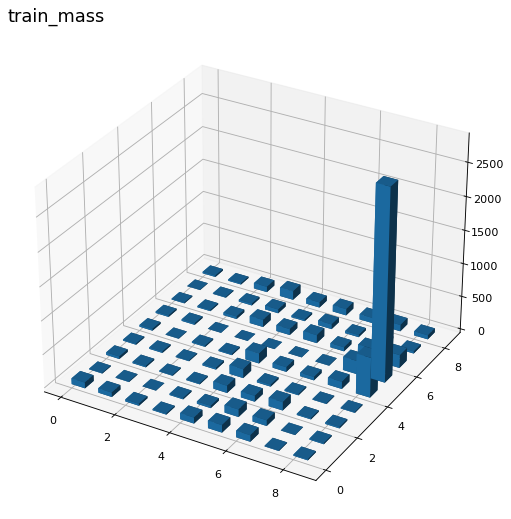

---predictions_test 55.80233073234558 seconds ---
best_cluster test =77


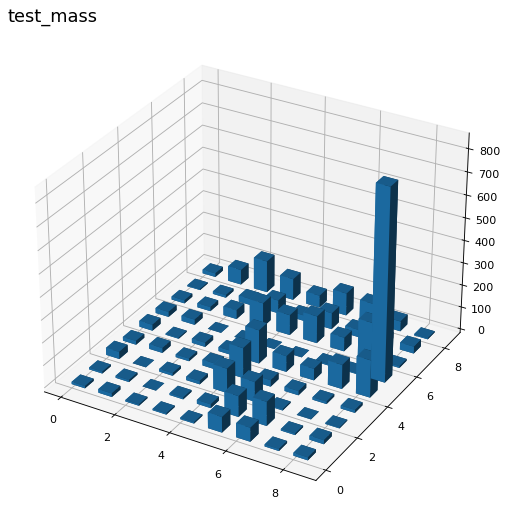

max_iter atteint
---training = 154.11250853538513 seconds ---
---predictions_train 108.92142724990845 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =78


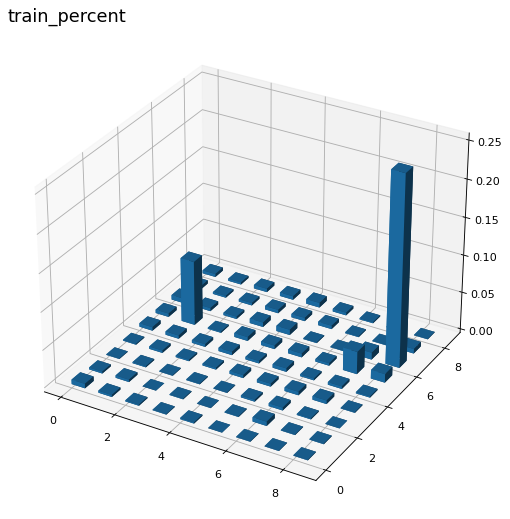

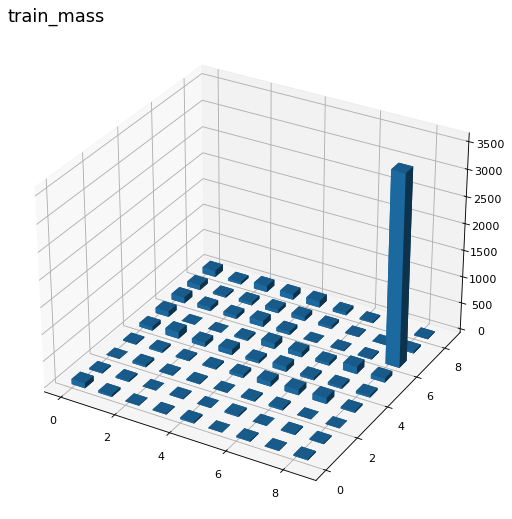

---predictions_test 53.13818097114563 seconds ---
best_cluster test =78


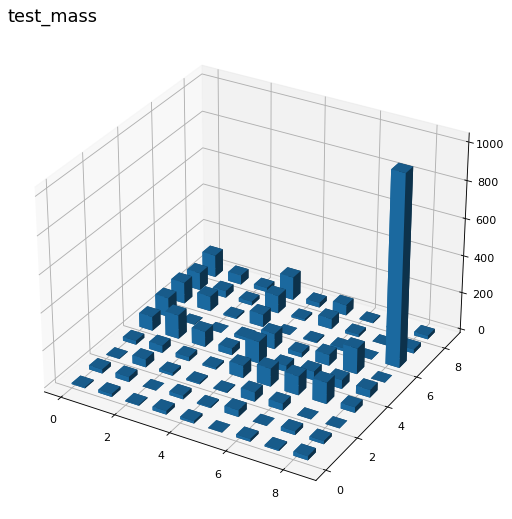

max_iter atteint
---training = 149.64171290397644 seconds ---
---predictions_train 107.39771962165833 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =72


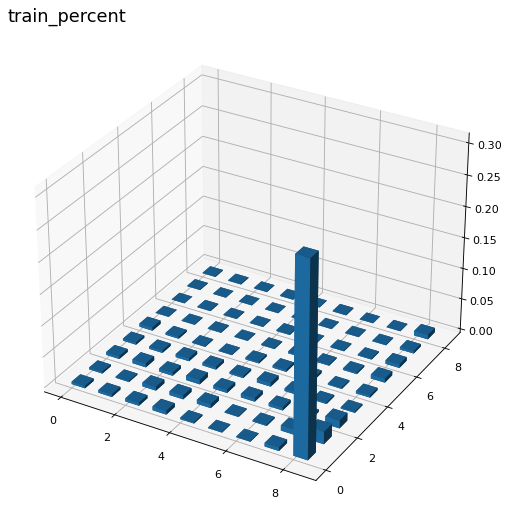

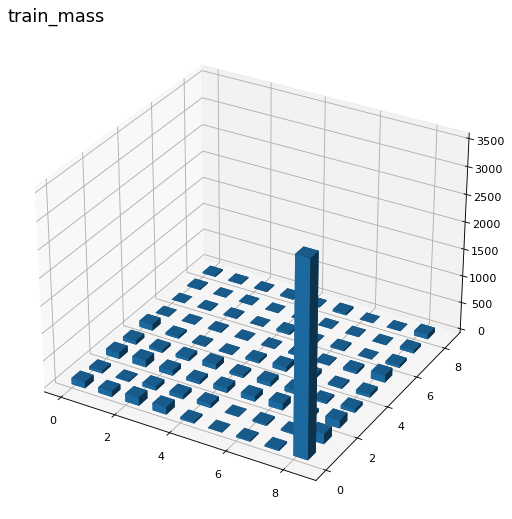

---predictions_test 54.26628088951111 seconds ---
best_cluster test =72


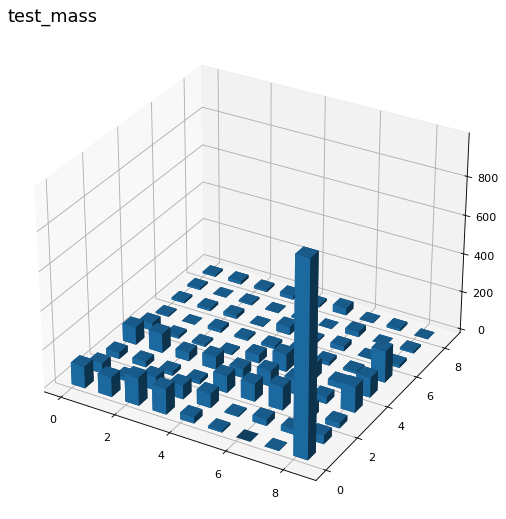

max_iter atteint
---training = 150.5216042995453 seconds ---
---predictions_train 106.2129385471344 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =45


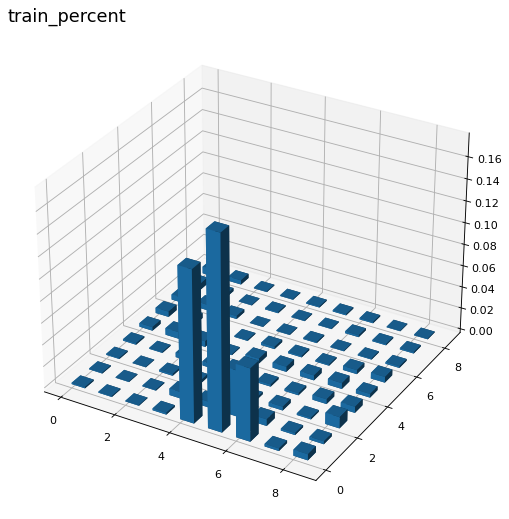

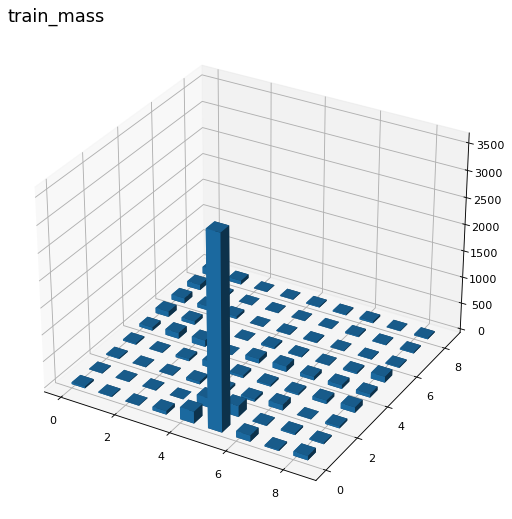

---predictions_test 55.19344758987427 seconds ---
best_cluster test =45


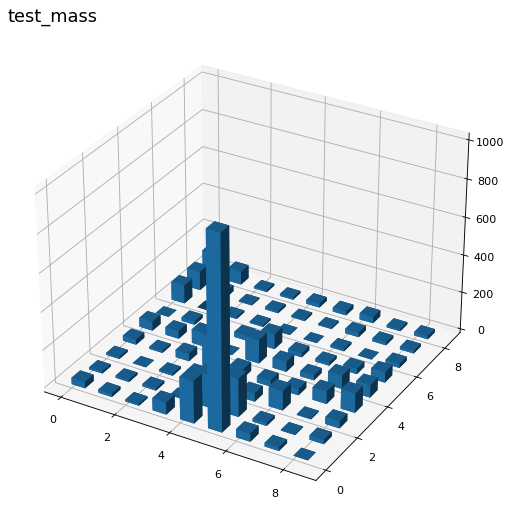

max_iter atteint
---training = 173.51637721061707 seconds ---
---predictions_train 121.59703373908997 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =77


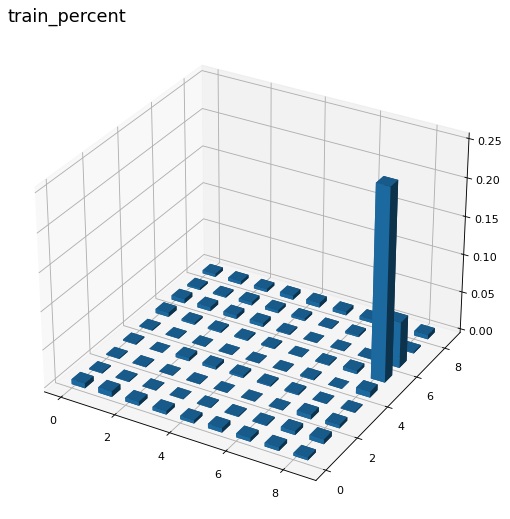

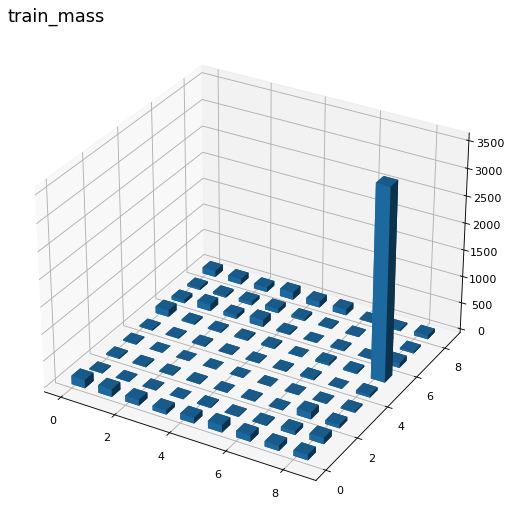

---predictions_test 54.40883159637451 seconds ---
best_cluster test =77


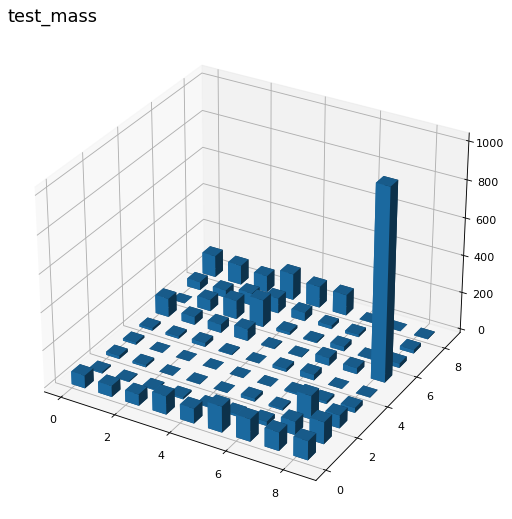

max_iter atteint
---training = 158.2814540863037 seconds ---
---predictions_train 108.71724843978882 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =18


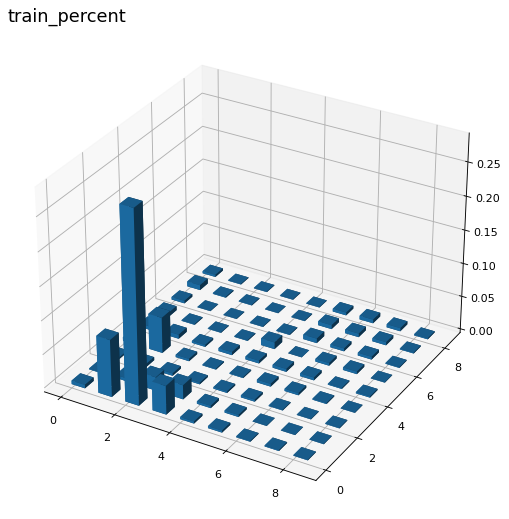

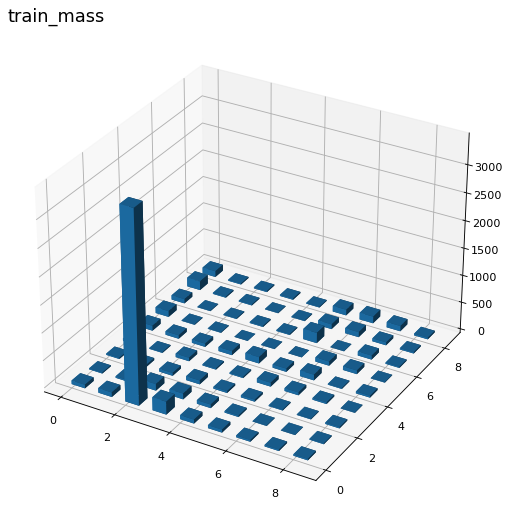

---predictions_test 54.489673137664795 seconds ---
best_cluster test =18


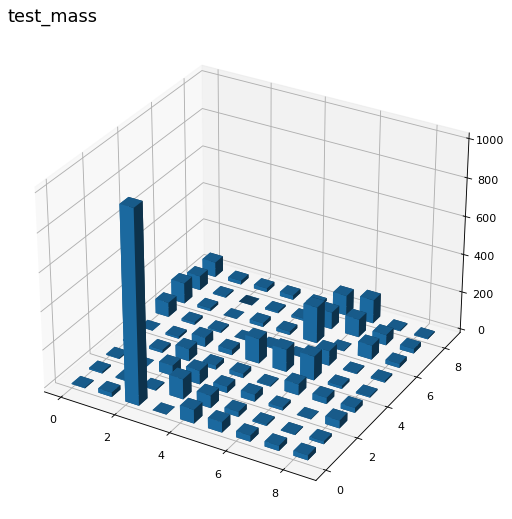

max_iter atteint
---training = 151.5989944934845 seconds ---
---predictions_train 106.76132154464722 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =8


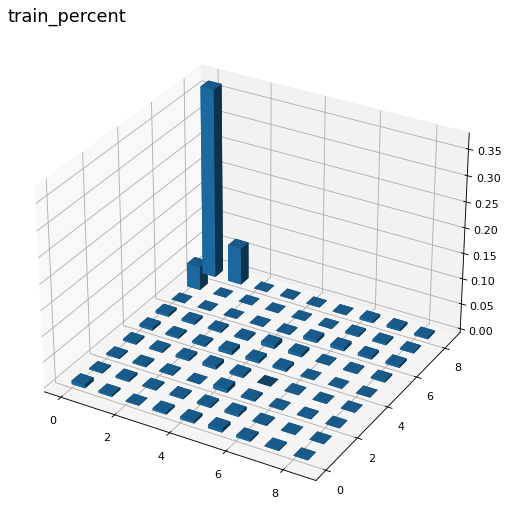

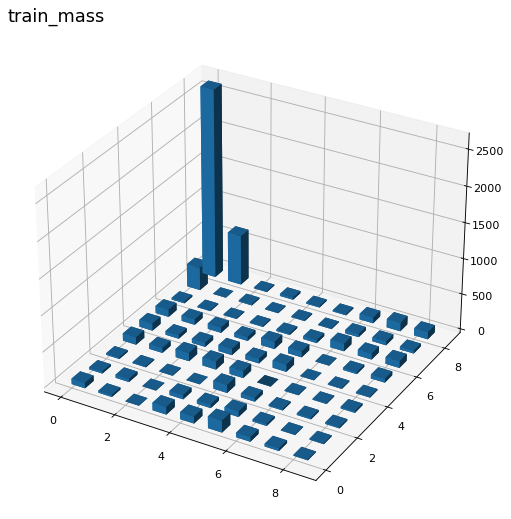

---predictions_test 55.21142387390137 seconds ---
best_cluster test =8


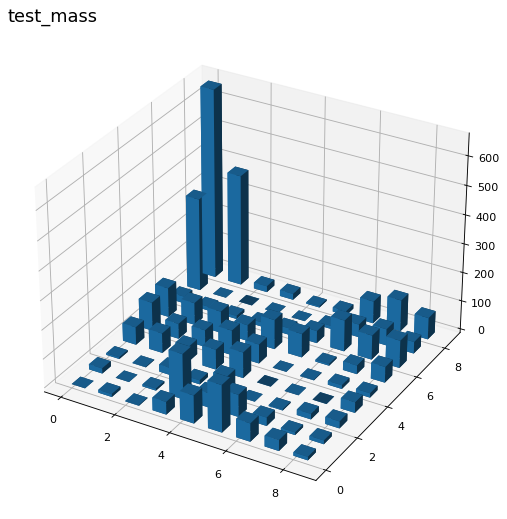

max_iter atteint
---training = 151.0163688659668 seconds ---
---predictions_train 107.46356463432312 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =78


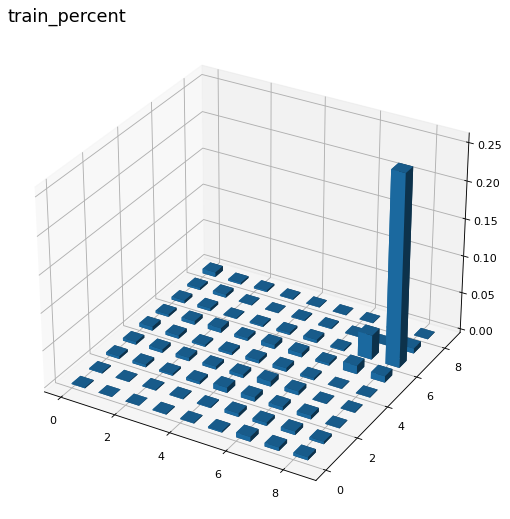

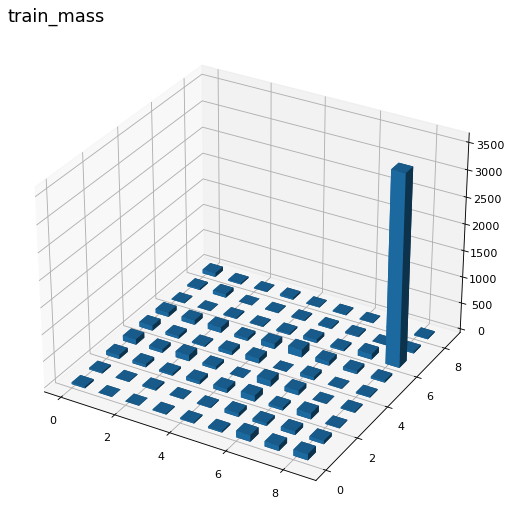

---predictions_test 53.373793601989746 seconds ---
best_cluster test =78


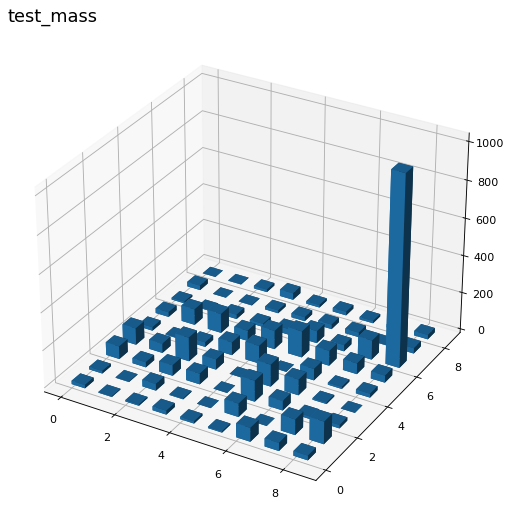

max_iter atteint
---training = 156.8316571712494 seconds ---
---predictions_train 121.17375659942627 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =35


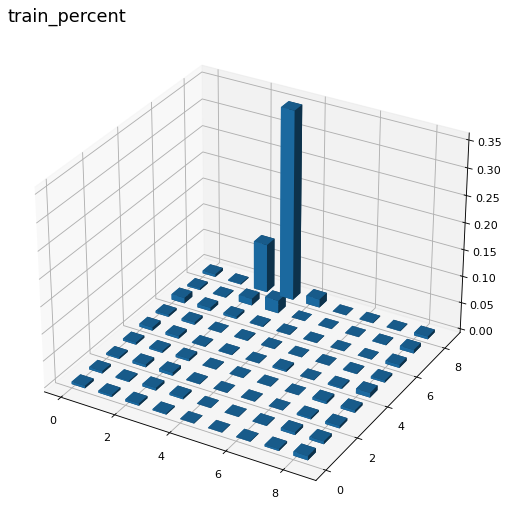

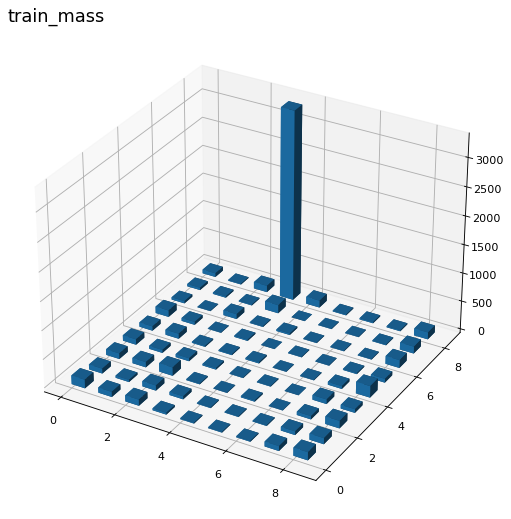

---predictions_test 59.99375677108765 seconds ---
best_cluster test =35


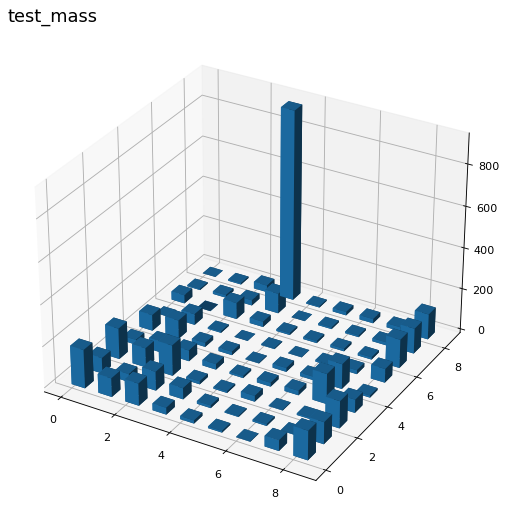

max_iter atteint
---training = 168.29210472106934 seconds ---
---predictions_train 114.73544979095459 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =80


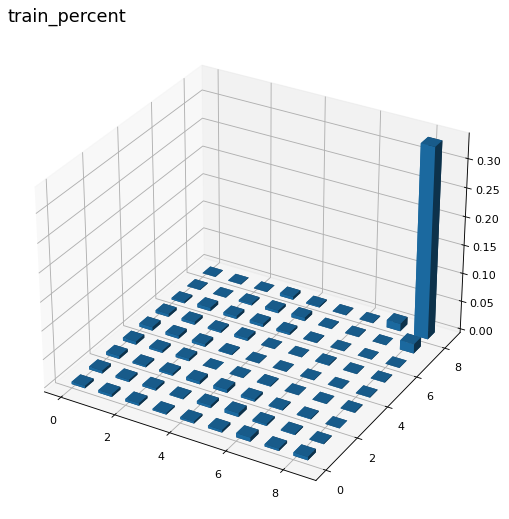

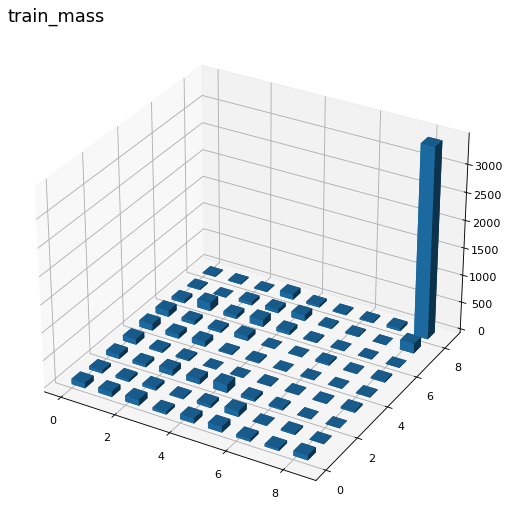

---predictions_test 54.070860862731934 seconds ---
best_cluster test =80


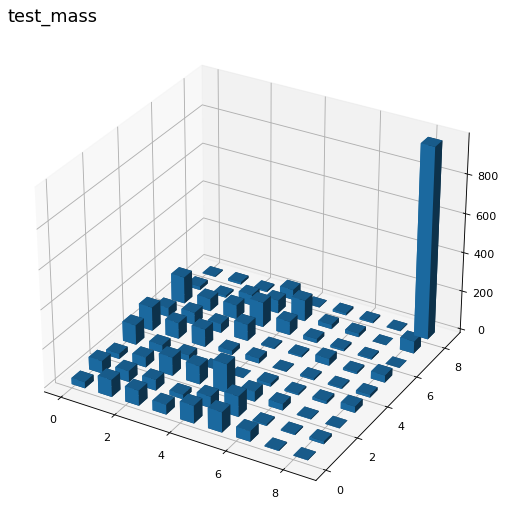

max_iter atteint
---training = 154.00111842155457 seconds ---
---predictions_train 109.05152034759521 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =74


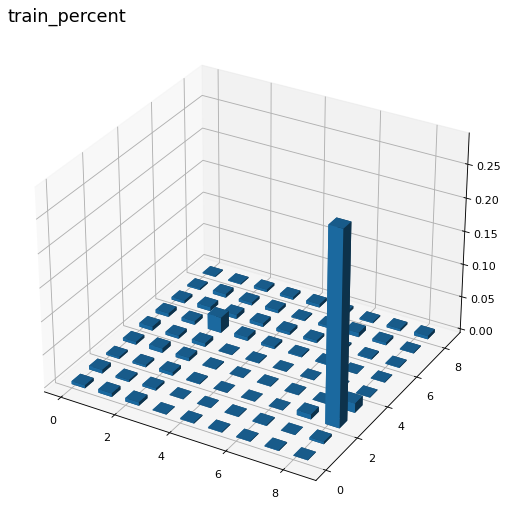

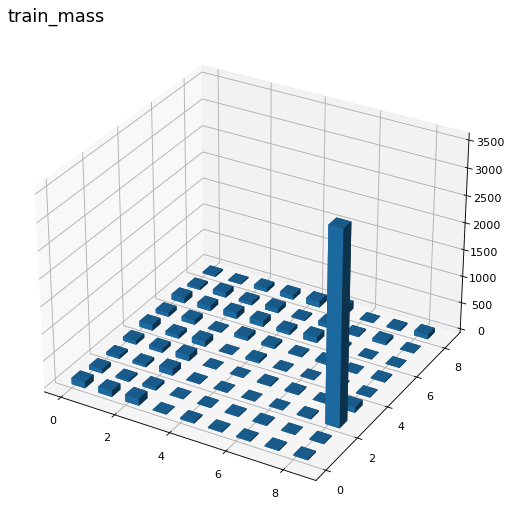

---predictions_test 54.25517153739929 seconds ---
best_cluster test =74


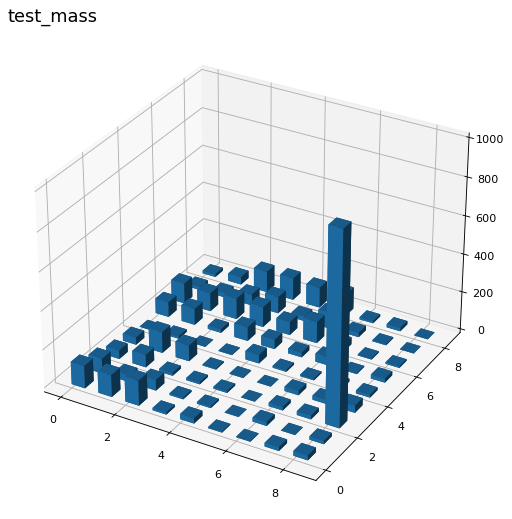

max_iter atteint
---training = 151.84232783317566 seconds ---
---predictions_train 107.31605458259583 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =72


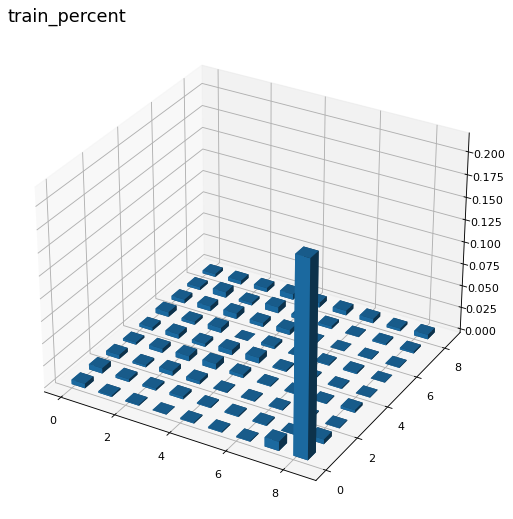

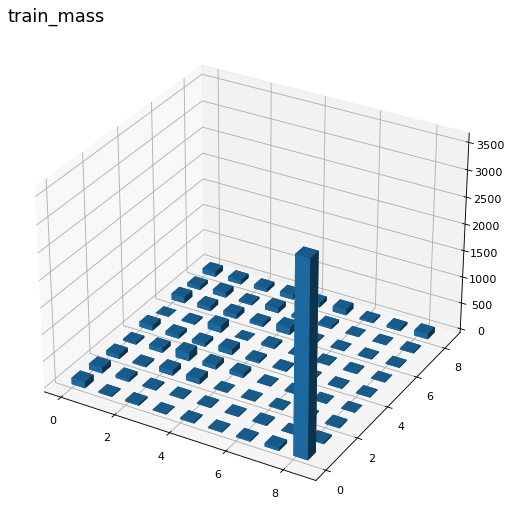

---predictions_test 54.03259491920471 seconds ---
best_cluster test =72


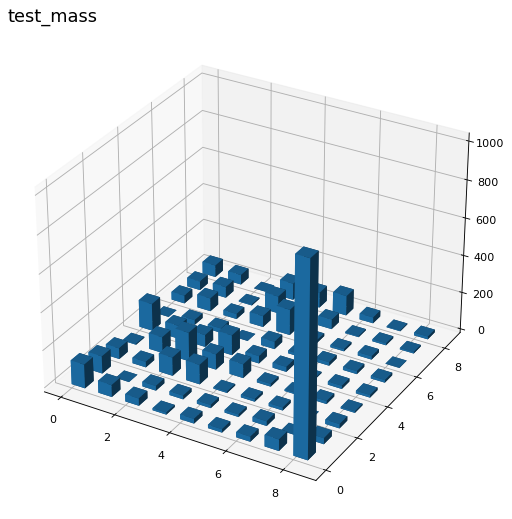

max_iter atteint
---training = 162.45641446113586 seconds ---
---predictions_train 108.89587545394897 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =36


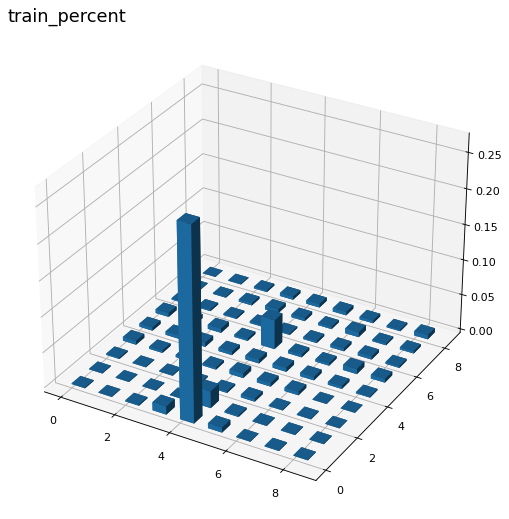

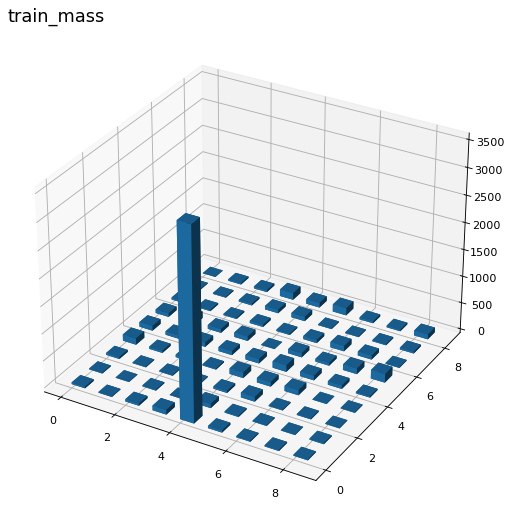

---predictions_test 55.91499161720276 seconds ---
best_cluster test =36


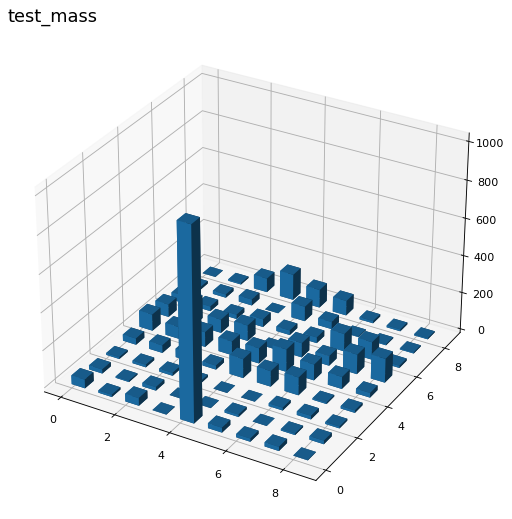

max_iter atteint
---training = 152.62171173095703 seconds ---
---predictions_train 108.72294902801514 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =6


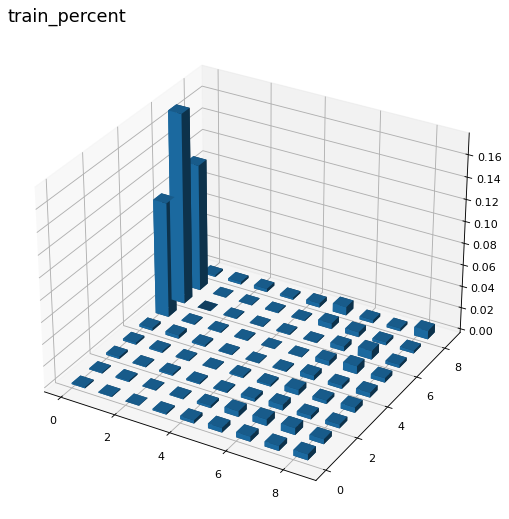

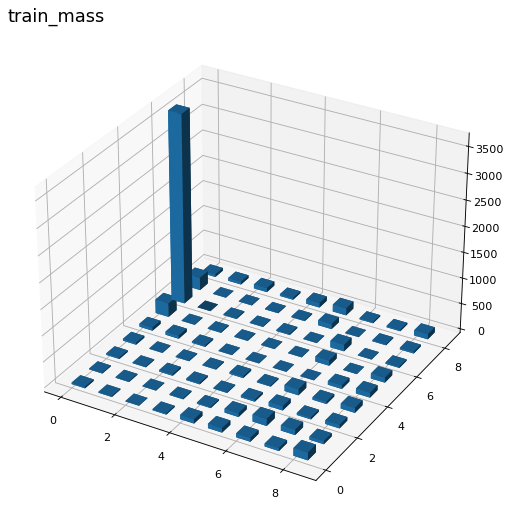

---predictions_test 54.322986125946045 seconds ---
best_cluster test =6


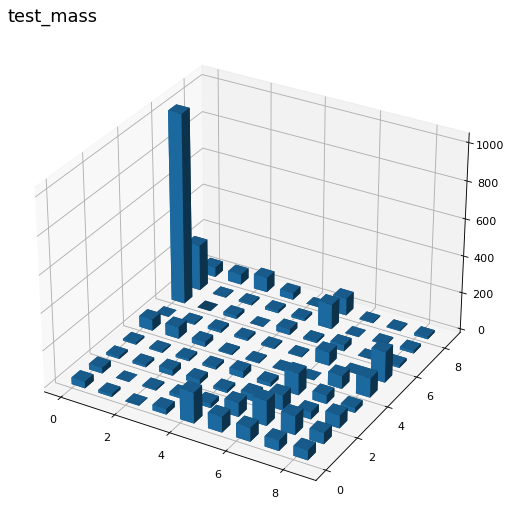

max_iter atteint
---training = 153.75829315185547 seconds ---
---predictions_train 108.90956139564514 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =0


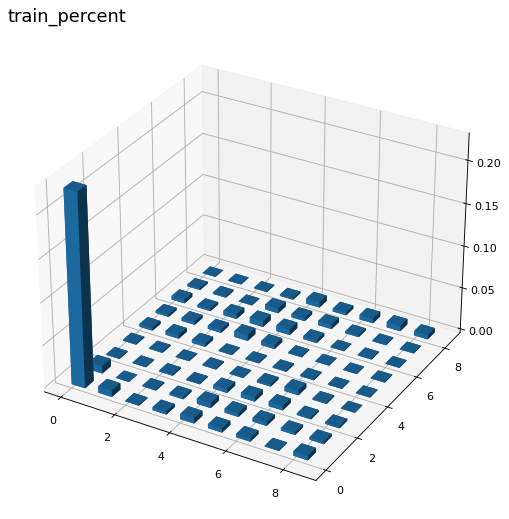

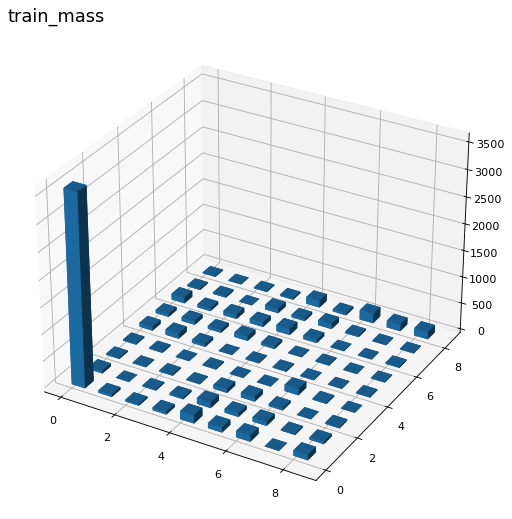

---predictions_test 54.65240788459778 seconds ---
best_cluster test =0


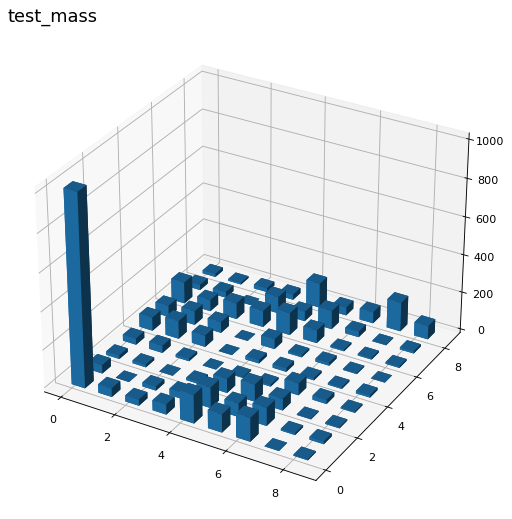

max_iter atteint
---training = 155.0559651851654 seconds ---
---predictions_train 108.53903841972351 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =35


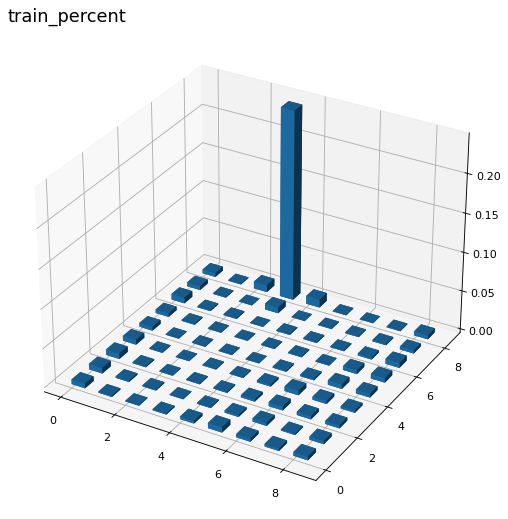

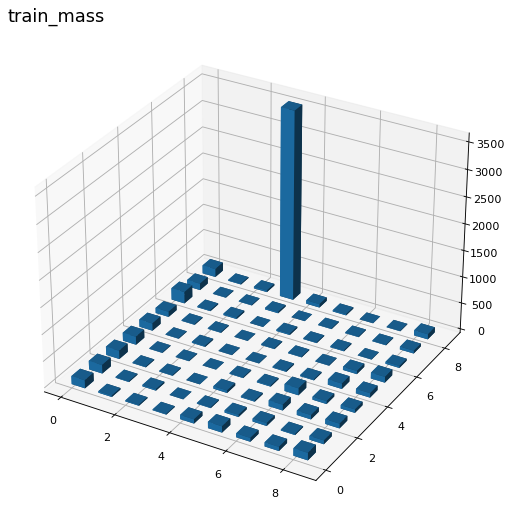

---predictions_test 58.48139762878418 seconds ---
best_cluster test =35


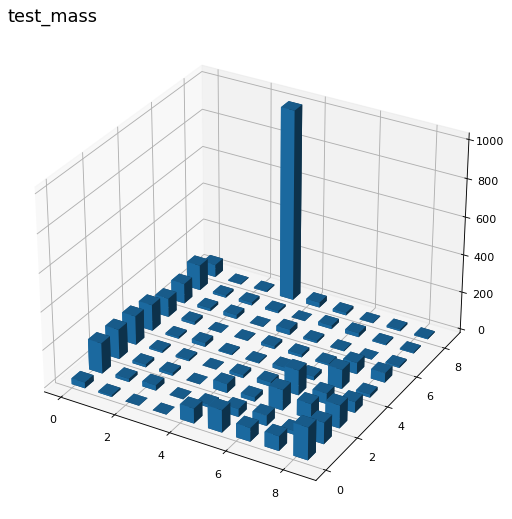

max_iter atteint
---training = 154.27697610855103 seconds ---
---predictions_train 109.55669903755188 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =54


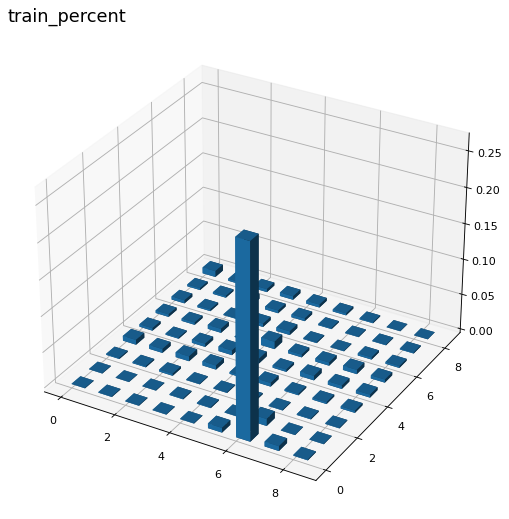

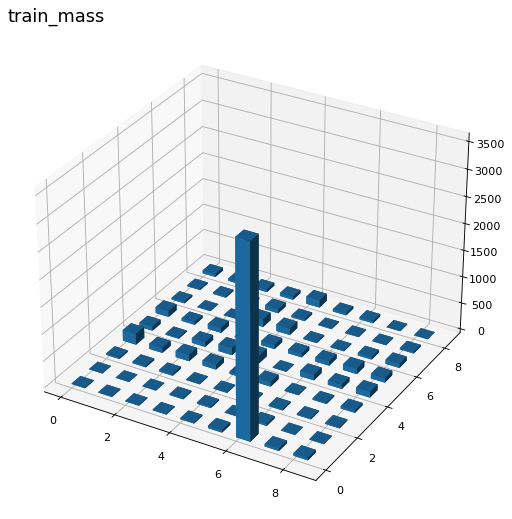

---predictions_test 54.442272901535034 seconds ---
best_cluster test =54


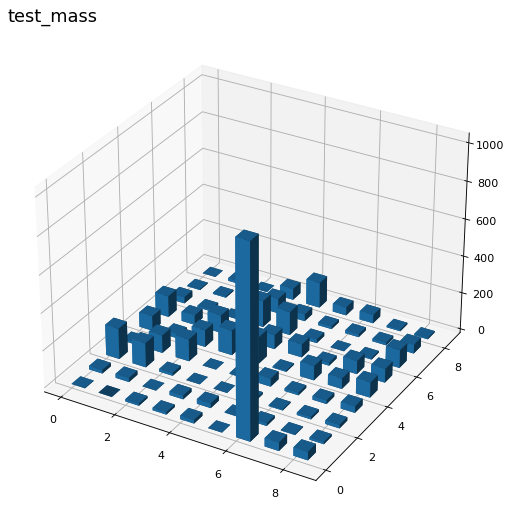

max_iter atteint
---training = 153.2685191631317 seconds ---
---predictions_train 109.05355620384216 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =80


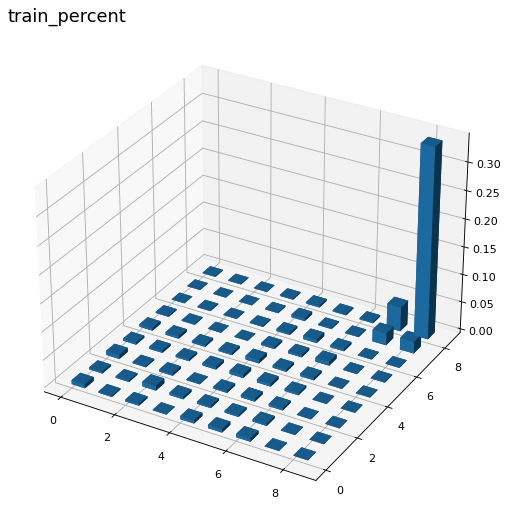

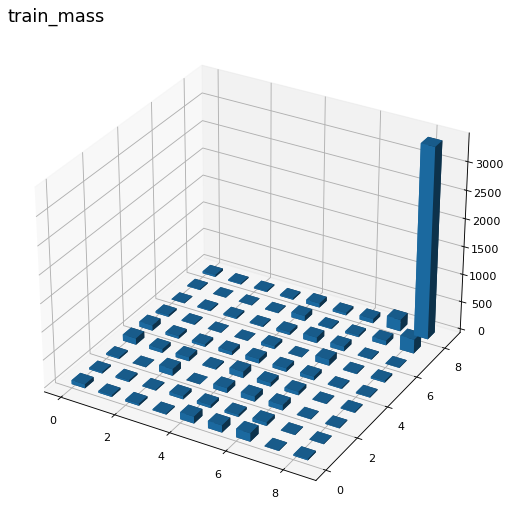

---predictions_test 54.20604372024536 seconds ---
best_cluster test =80


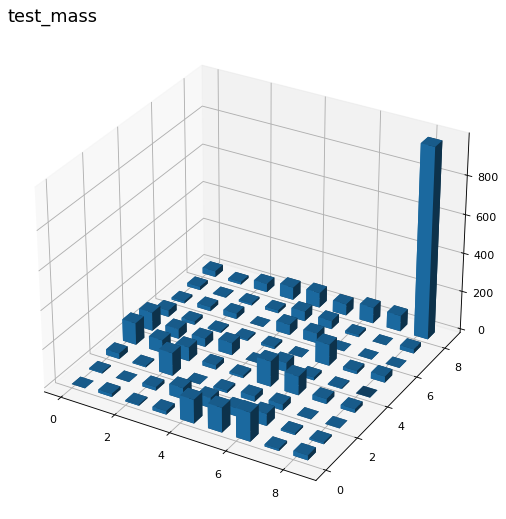

max_iter atteint
---training = 160.59067296981812 seconds ---
---predictions_train 110.39826655387878 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =77


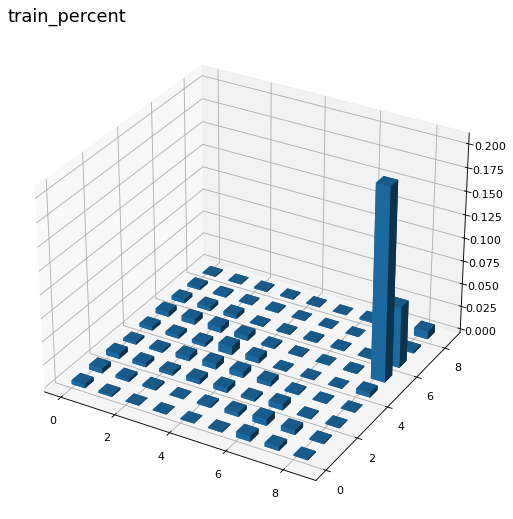

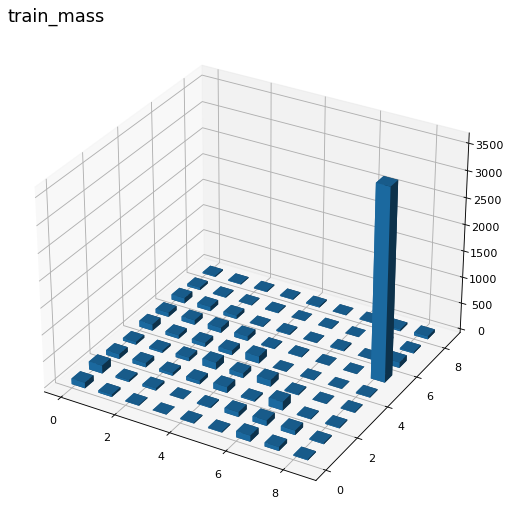

---predictions_test 55.18756723403931 seconds ---
best_cluster test =77


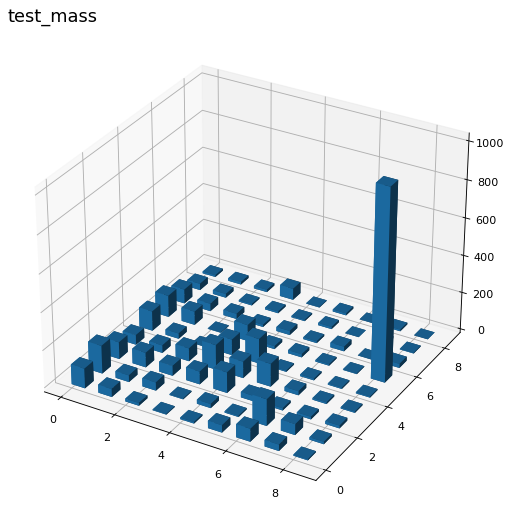

max_iter atteint
---training = 154.17761421203613 seconds ---
---predictions_train 109.03680396080017 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =54


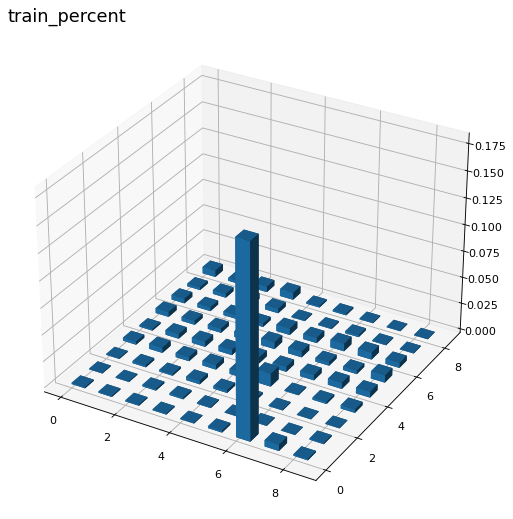

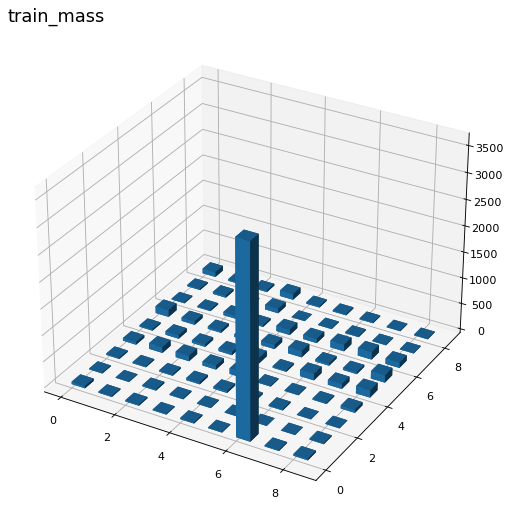

---predictions_test 54.42079138755798 seconds ---
best_cluster test =54


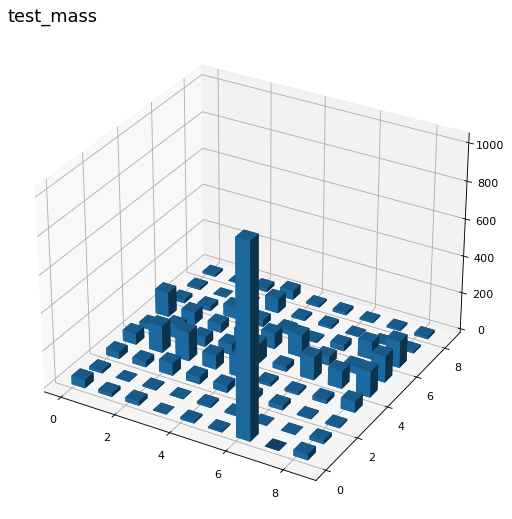

max_iter atteint
---training = 154.655424118042 seconds ---
---predictions_train 108.13791823387146 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =36


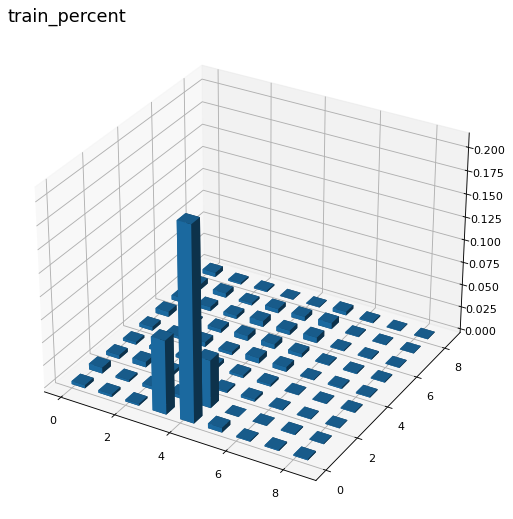

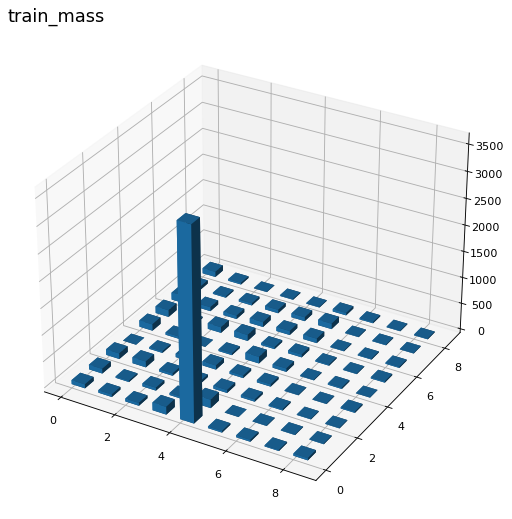

---predictions_test 55.405951738357544 seconds ---
best_cluster test =36


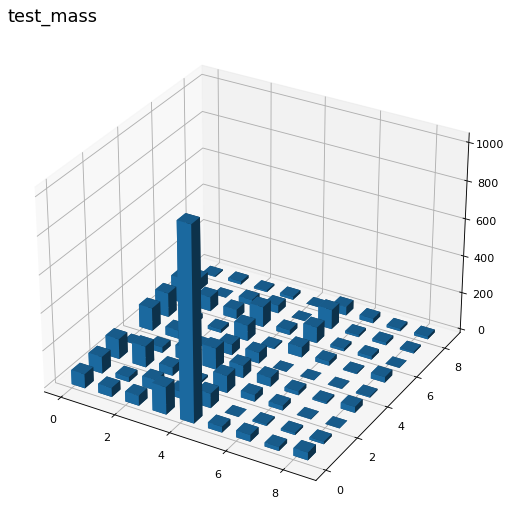

max_iter atteint
---training = 152.5868194103241 seconds ---
---predictions_train 108.37452435493469 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =20


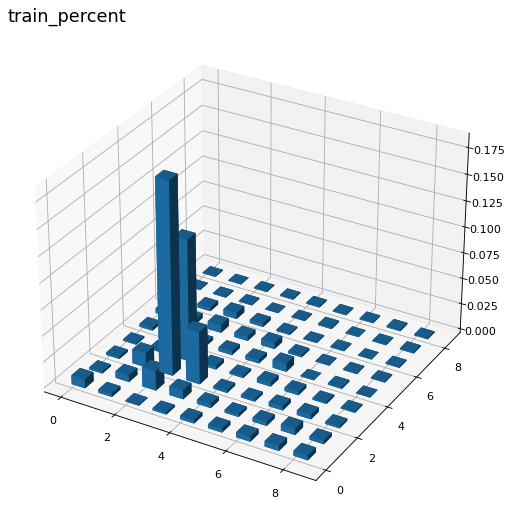

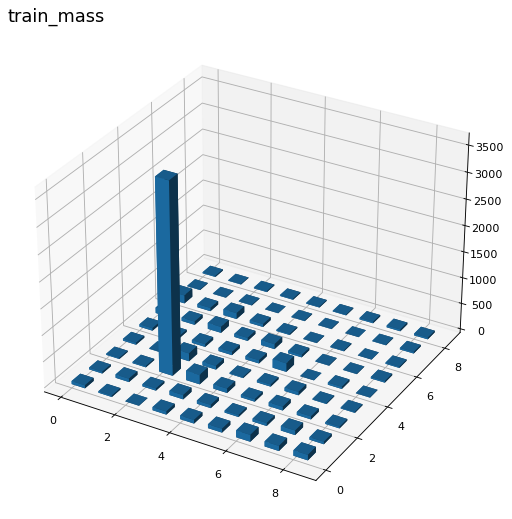

---predictions_test 56.226510524749756 seconds ---
best_cluster test =20


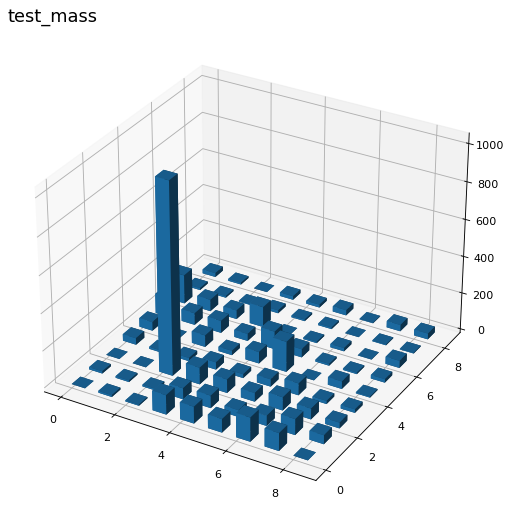

max_iter atteint
---training = 169.75866651535034 seconds ---
---predictions_train 116.63243436813354 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =75


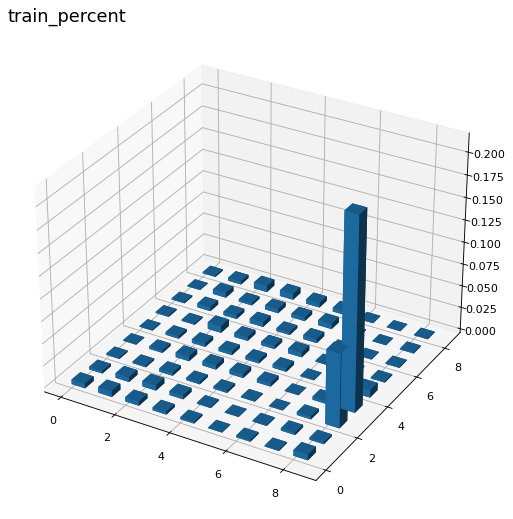

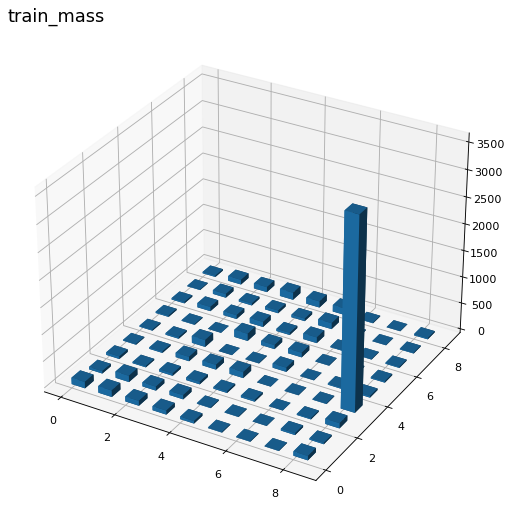

---predictions_test 54.33786964416504 seconds ---
best_cluster test =75


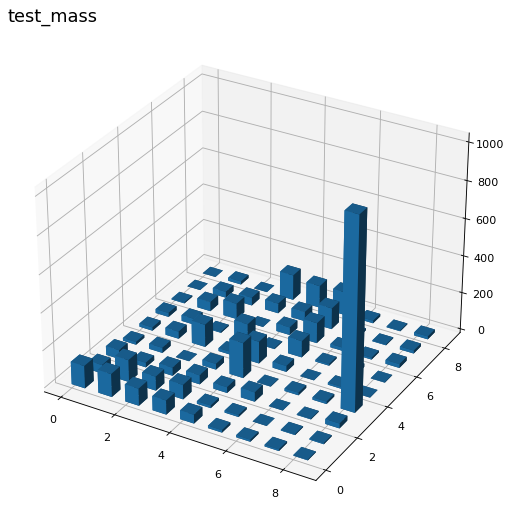

max_iter atteint
---training = 149.7644546031952 seconds ---
---predictions_train 106.7486469745636 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =78


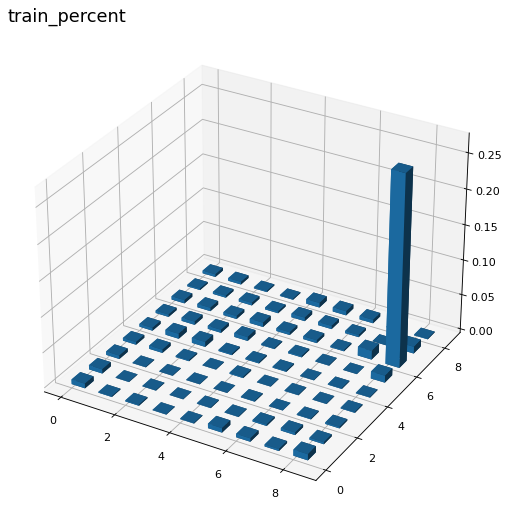

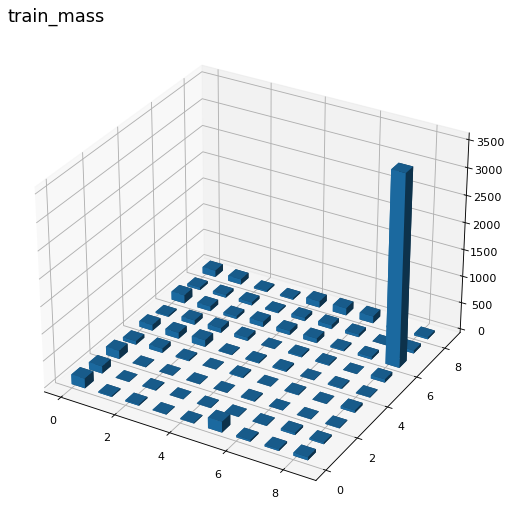

---predictions_test 53.680482149124146 seconds ---
best_cluster test =78


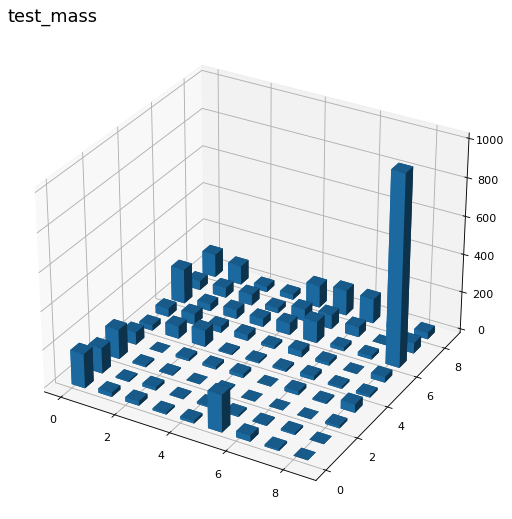

max_iter atteint
---training = 158.05165672302246 seconds ---
---predictions_train 115.01621866226196 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =75


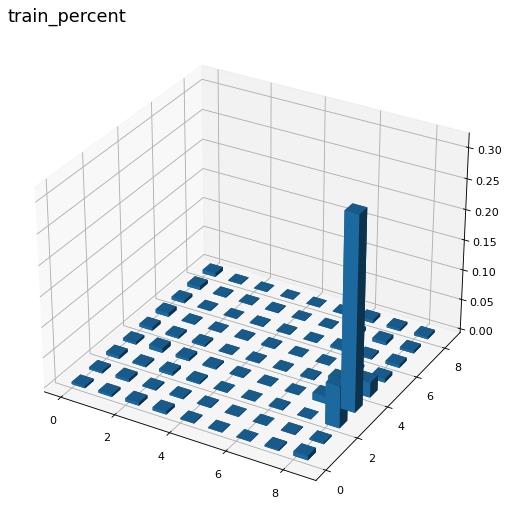

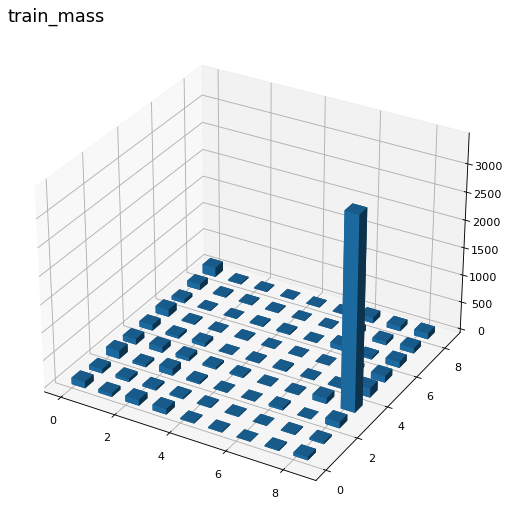

---predictions_test 60.2450475692749 seconds ---
best_cluster test =75


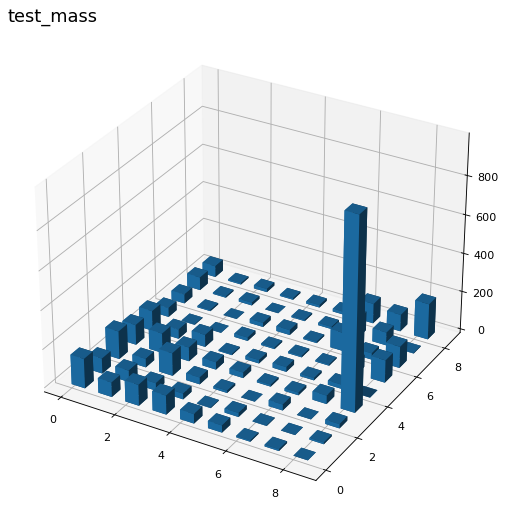

max_iter atteint
---training = 166.34766507148743 seconds ---
---predictions_train 116.94892597198486 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =44


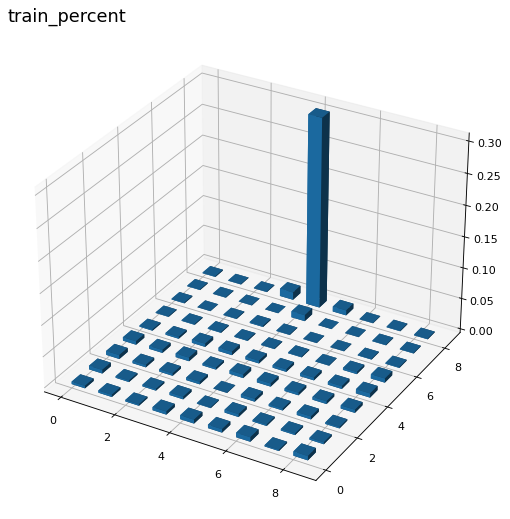

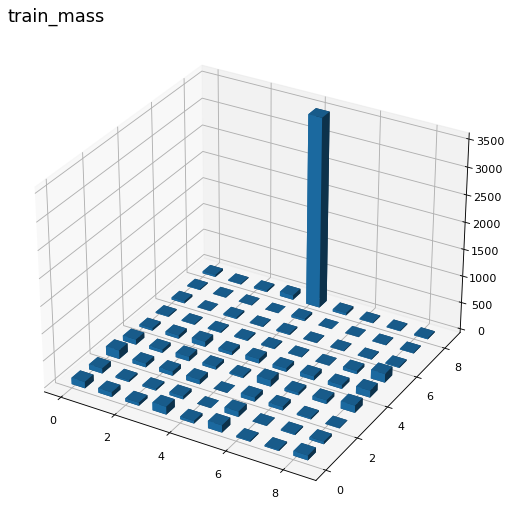

---predictions_test 59.61423969268799 seconds ---
best_cluster test =44


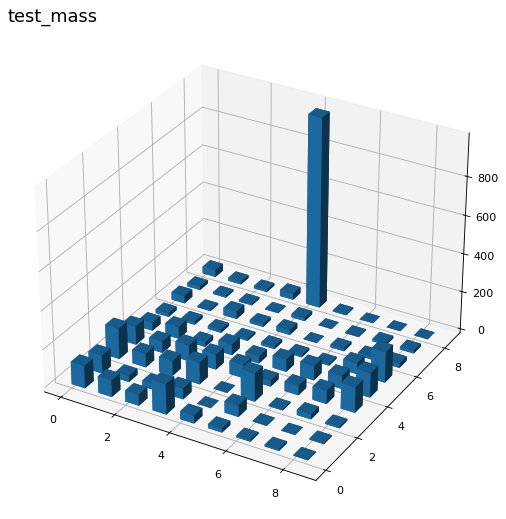

max_iter atteint
---training = 169.39721870422363 seconds ---
---predictions_train 120.19648027420044 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =54


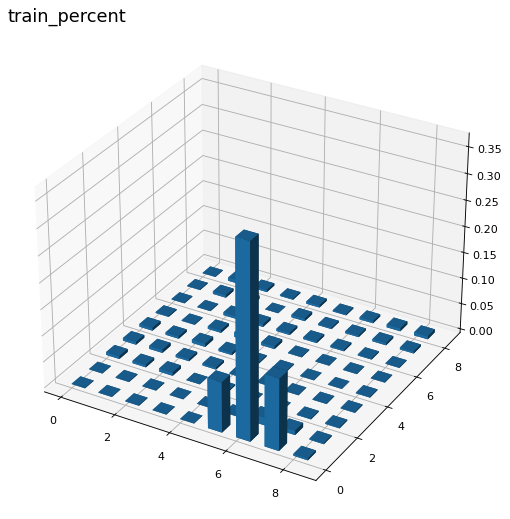

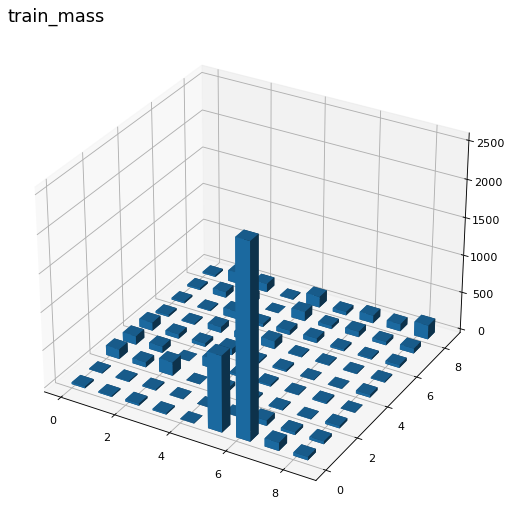

---predictions_test 58.669519901275635 seconds ---
best_cluster test =54


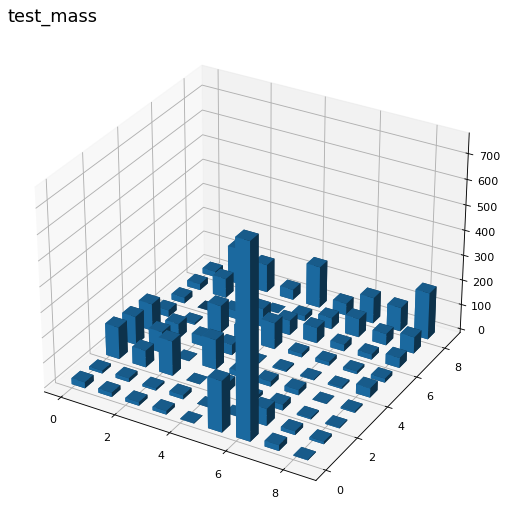

max_iter atteint
---training = 165.69548654556274 seconds ---
---predictions_train 117.15630722045898 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =44


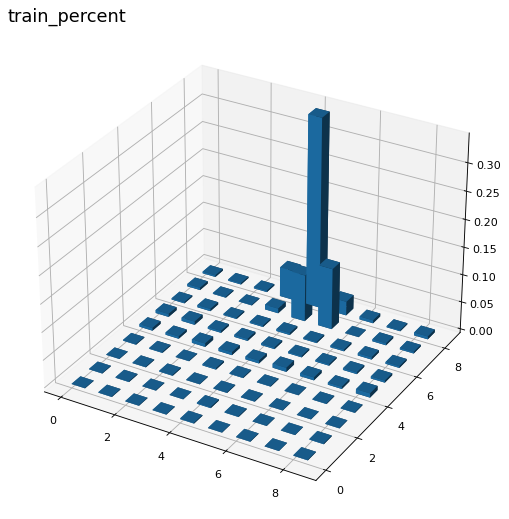

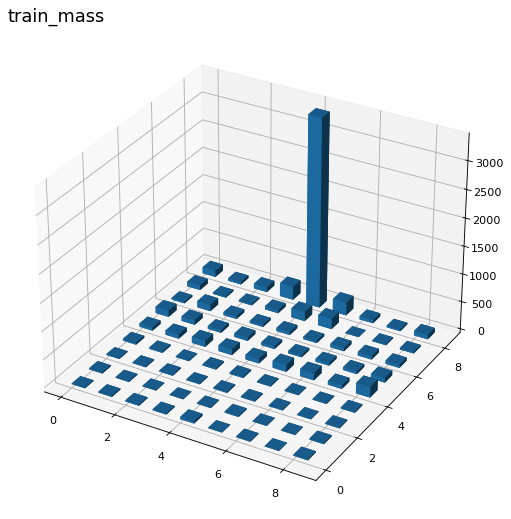

---predictions_test 58.24339699745178 seconds ---
best_cluster test =44


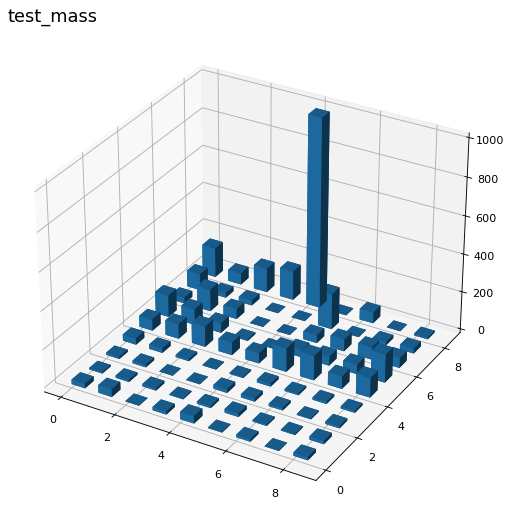

max_iter atteint
---training = 164.22723150253296 seconds ---
---predictions_train 116.84213614463806 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =8


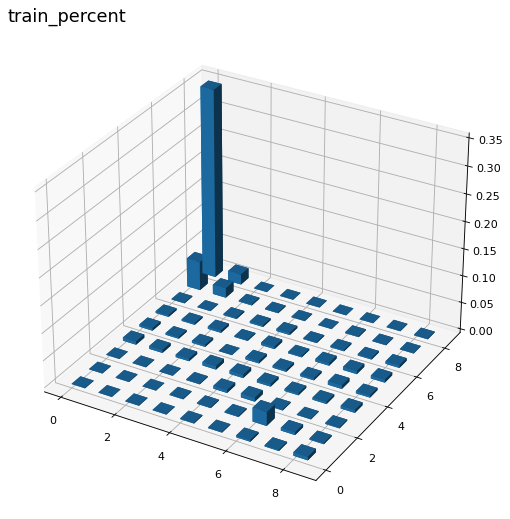

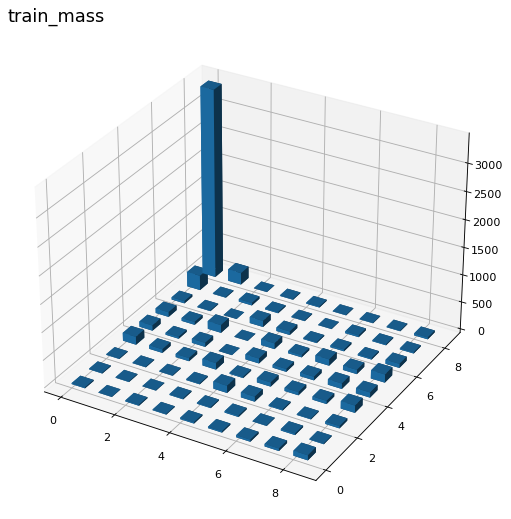

---predictions_test 62.88794779777527 seconds ---
best_cluster test =8


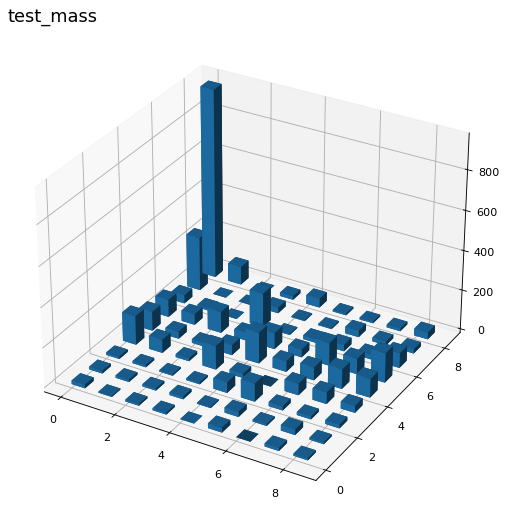

max_iter atteint
---training = 165.51056170463562 seconds ---
---predictions_train 121.18999218940735 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =8


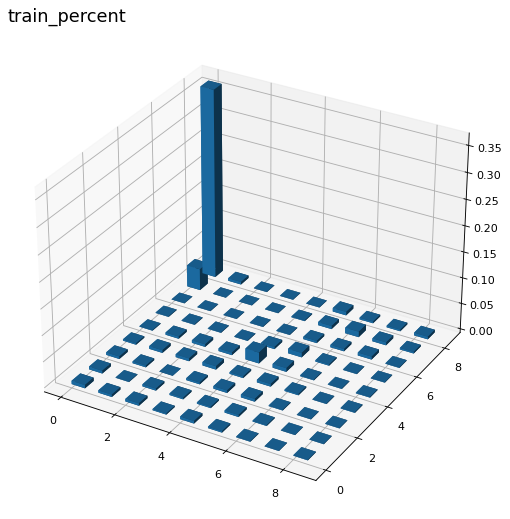

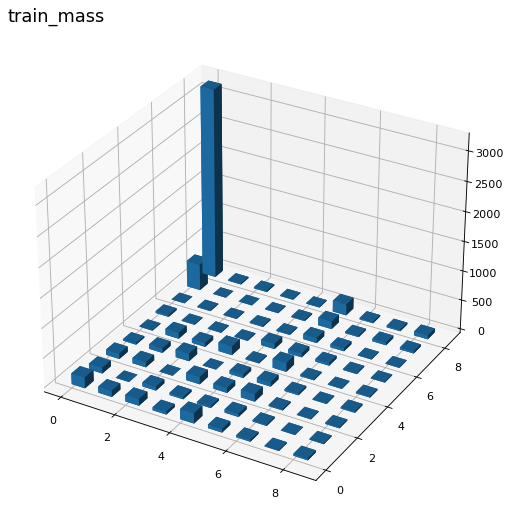

---predictions_test 74.01396059989929 seconds ---
best_cluster test =8


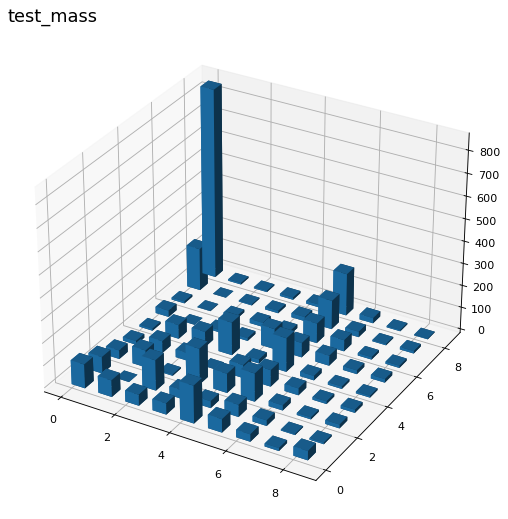

max_iter atteint
---training = 175.8675661087036 seconds ---
---predictions_train 124.15280532836914 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =76


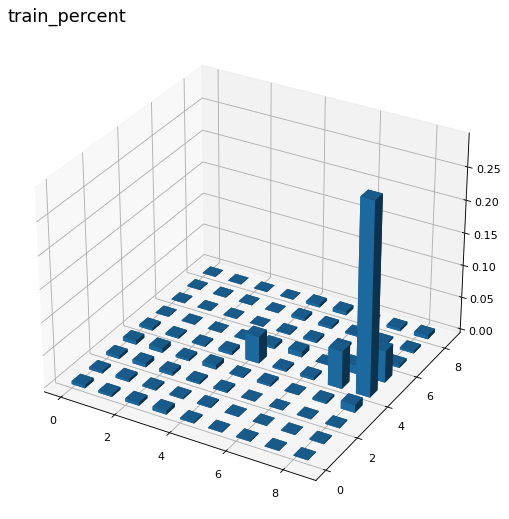

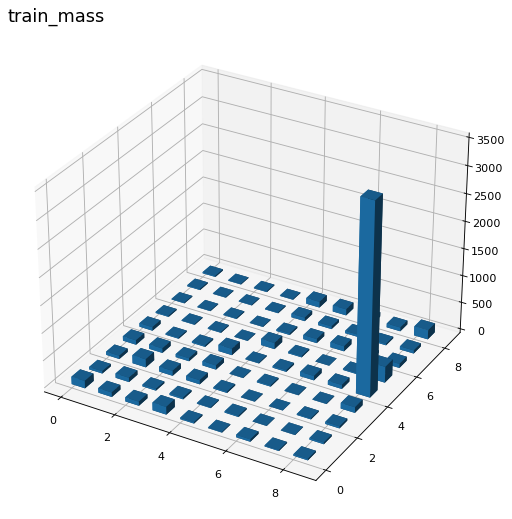

---predictions_test 71.16174793243408 seconds ---
best_cluster test =76


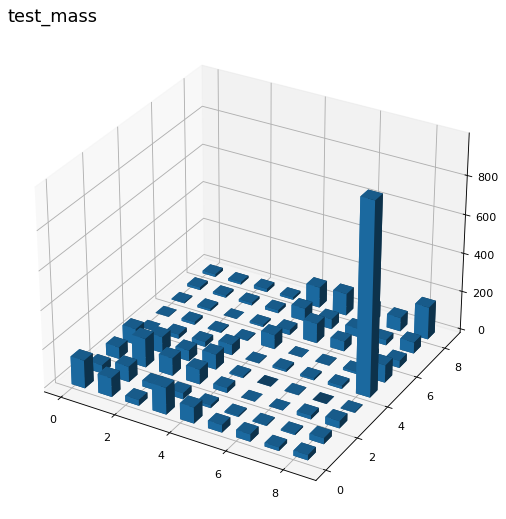

max_iter atteint
---training = 164.64409160614014 seconds ---
---predictions_train 110.31452441215515 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =72


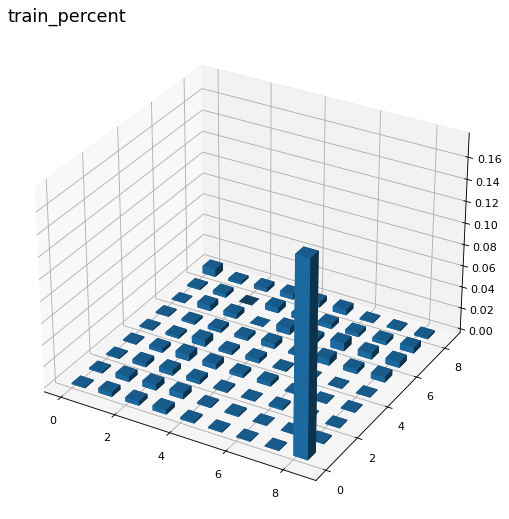

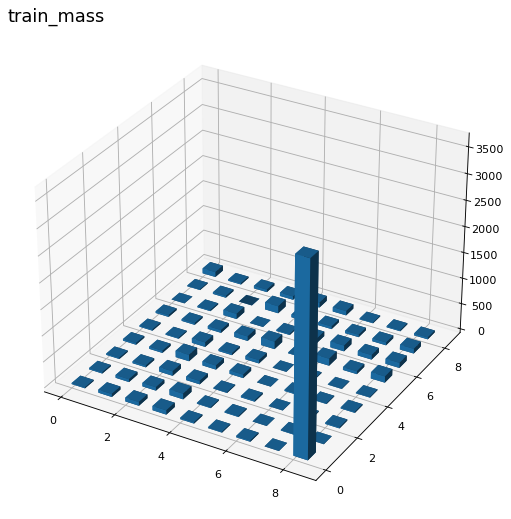

---predictions_test 54.921472787857056 seconds ---
best_cluster test =72


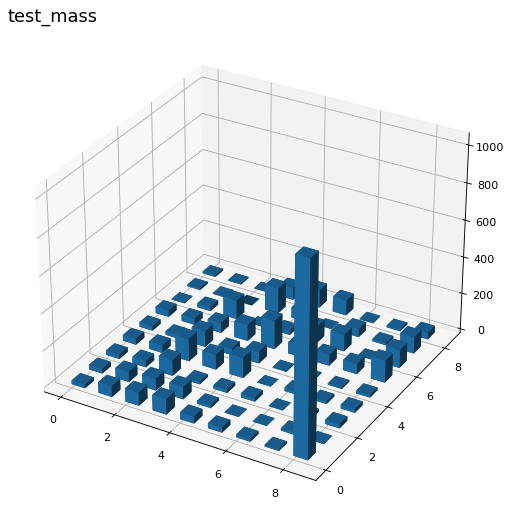

max_iter atteint
---training = 155.2773094177246 seconds ---
---predictions_train 110.48287725448608 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =57


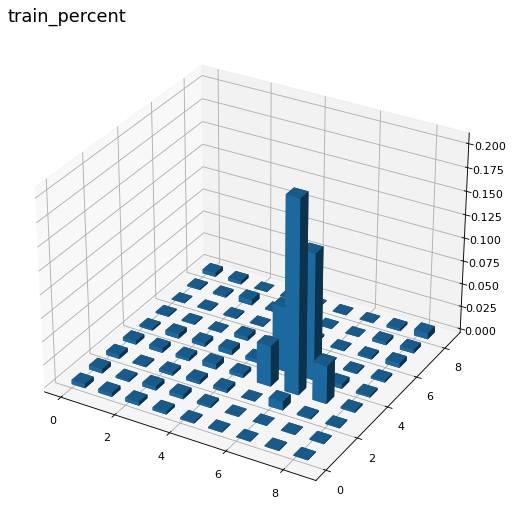

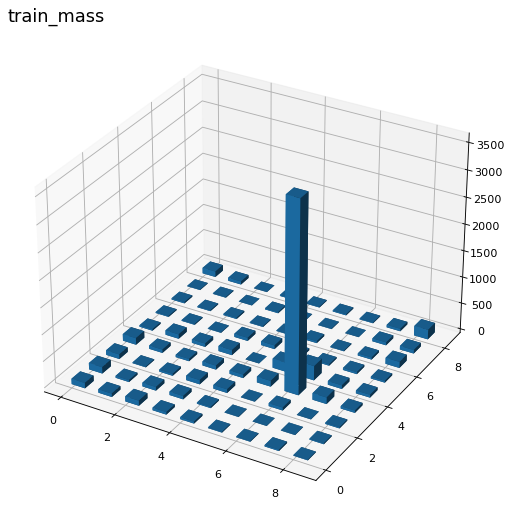

---predictions_test 55.283581256866455 seconds ---
best_cluster test =57


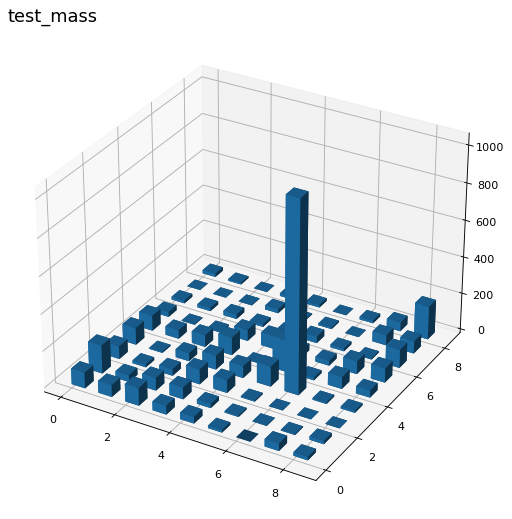

max_iter atteint
---training = 153.49768376350403 seconds ---
---predictions_train 110.63654494285583 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =3


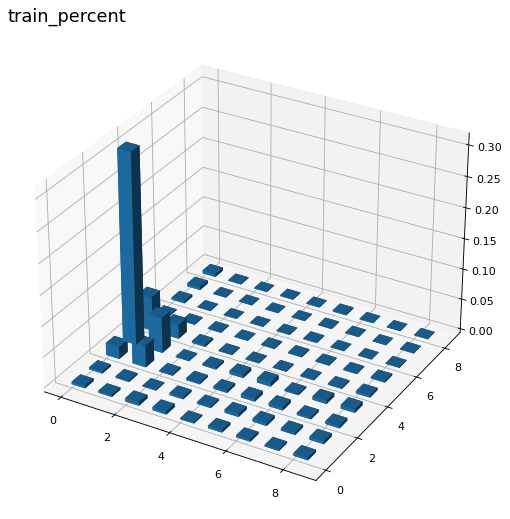

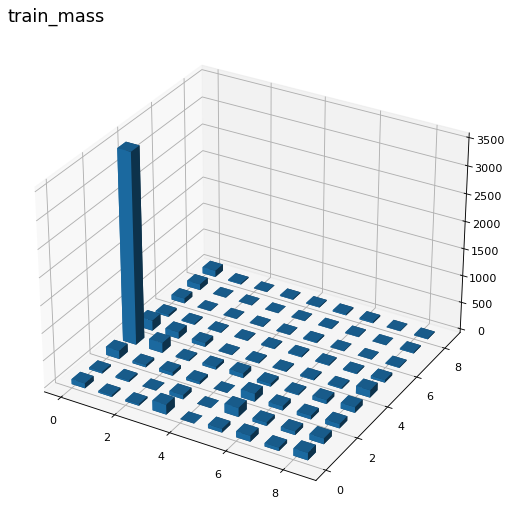

---predictions_test 60.382506370544434 seconds ---
best_cluster test =3


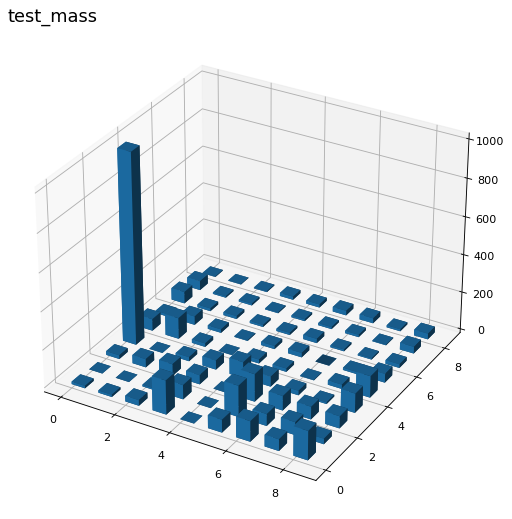

max_iter atteint
---training = 157.8444948196411 seconds ---
---predictions_train 106.14590001106262 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =80


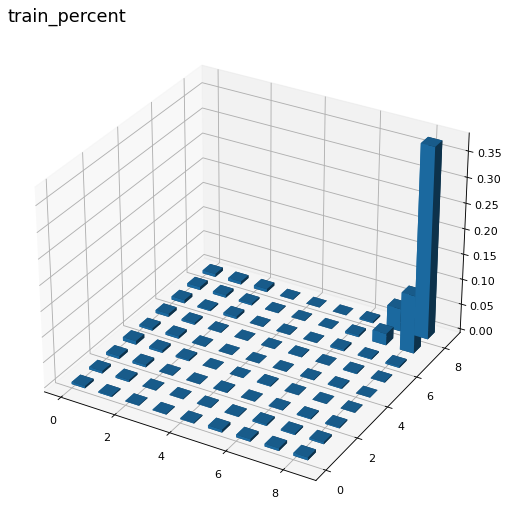

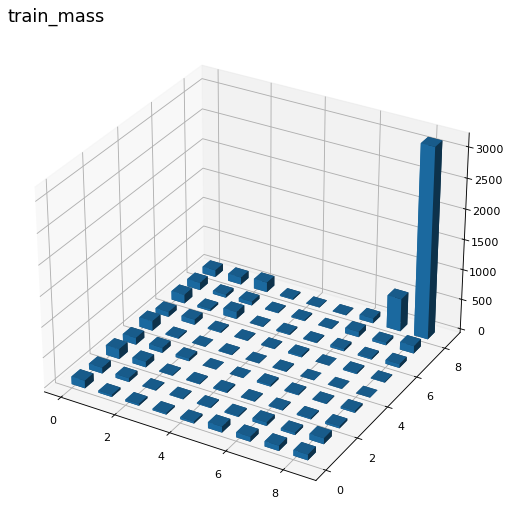

---predictions_test 54.970404624938965 seconds ---
best_cluster test =80


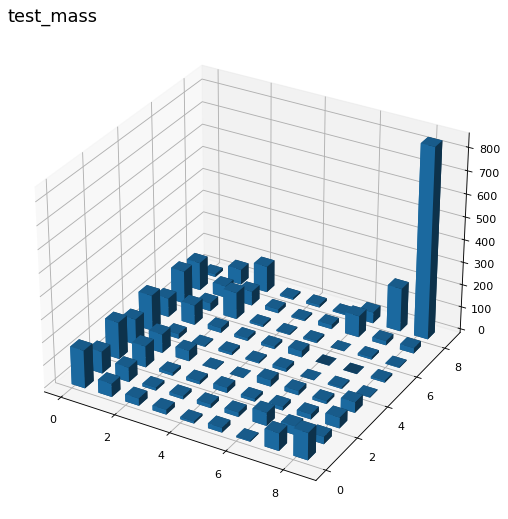

max_iter atteint
---training = 164.20641231536865 seconds ---
---predictions_train 113.14359283447266 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =76


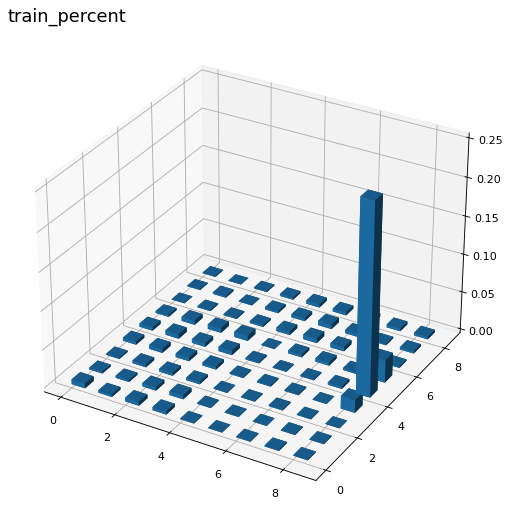

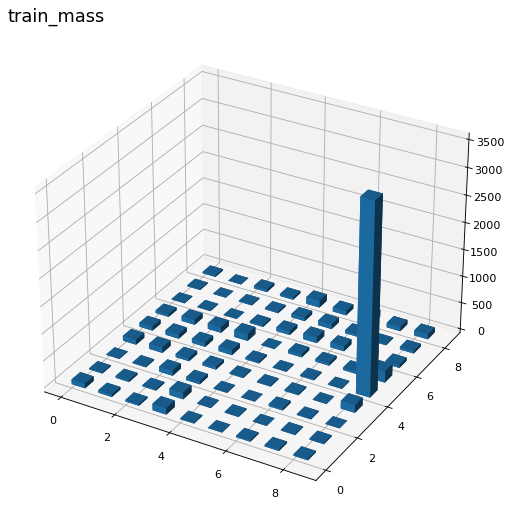

---predictions_test 54.878466844558716 seconds ---
best_cluster test =76


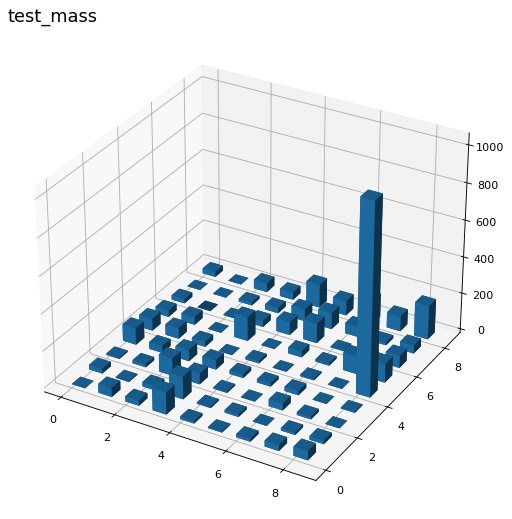

max_iter atteint
---training = 154.16461491584778 seconds ---
---predictions_train 105.91838431358337 seconds ---
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =0


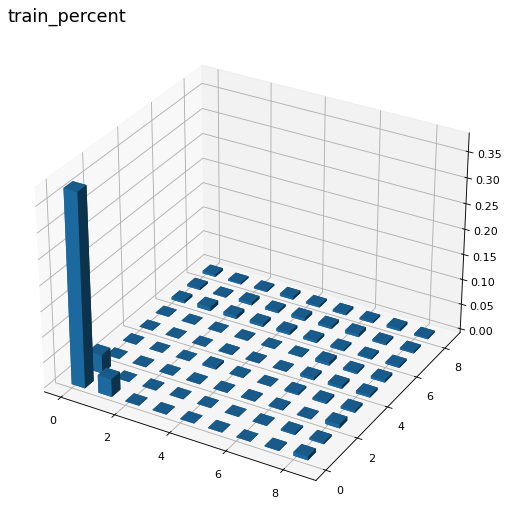

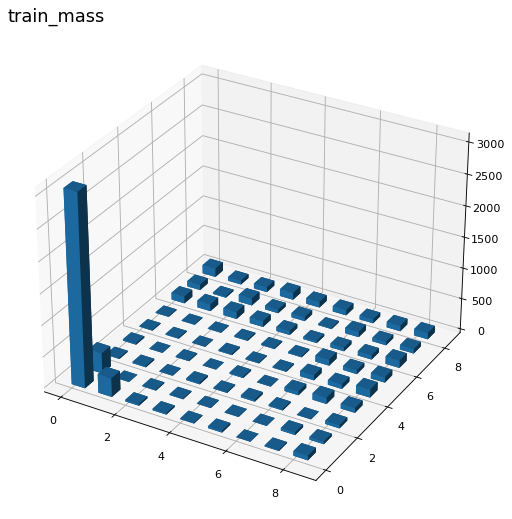

---predictions_test 55.897236347198486 seconds ---
best_cluster test =0


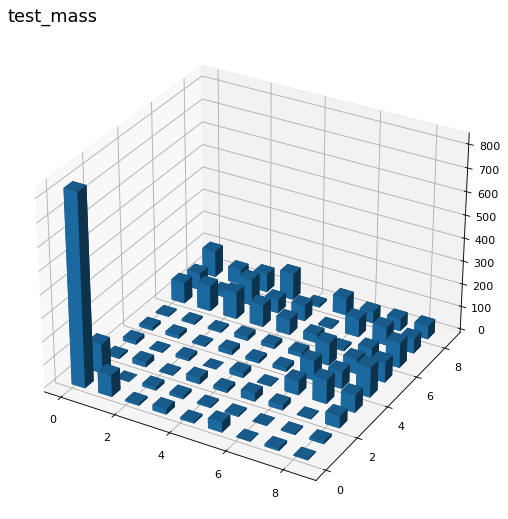

In [18]:
execution_SOM(saving_train,saving_test,Y_train ,Y_test,affichage="all")

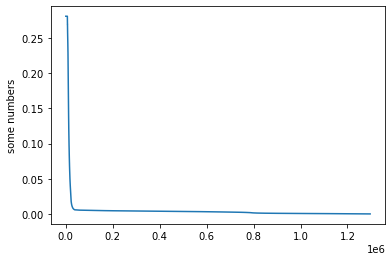

10135 values above 20% 
17712 values above 5% 
22376 values above 2% 


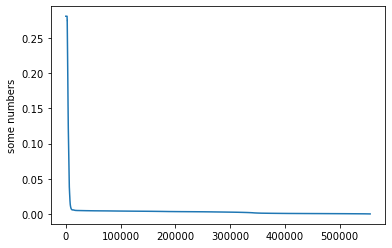

3594 values above 20% 
5966 values above 5% 
7545 values above 2% 


In [19]:
affiche_moyenne(saving_train,nombre_de_models)
affiche_moyenne(saving_test,nombre_de_models)

In [20]:

#to read
#http://citeseerx.ist.psu.edu/viewdoc/download?doi=10.1.1.697.8197&rep=rep1&type=pdf

In [21]:
# assosier les pourcents de chaques donnée sachant son cluster
#percent contien le pourcent associé a chaques cluster
#prediction contien le cluster a qui appartien chaques donnée


In [22]:
#on va calculer un knonene ---> on a des cluster ---> on a des pourcents 
# on va utilise ce konenen sur les donnée val pour le atribuée des cluster 
# donc on peut leur attribuer des pourcents 
#on recomence 50 fois , et on fait la moyenne min 5 H d'execution
#


In [23]:
#etape de test
#test 1
#en premier j'ai testé mes data en trichant pour voir si ca faisait nimporte quoi
#j'ai train SOM_train sur Train
#j'ai executé SOM_train sur train ,calculer les % avec y_train,  affiche
#j'ai executé SOM_train sur test  ,calculer les % avec y_test ,  affiche
#les courbes etait tres similaires 
#a noter que je recalculais les % des cluster en utilisant y_test
# donc je ne doit pas m'en servir normalement
#test 2
#j'ai train SOM_train sur Train
#j'ai executé SOM_train sur train ,calculer les % avec y_train,  affiche
#j'ai executé SOM_train sur test  
# calculer les % avec les percent de cluster obtenu dans le training
#afficher
#c'est prometteur

In [24]:
moy= moyenne(saving_train,nombre_de_models)

In [25]:

#ajouter les pourcent comme une nouvelle colonne
print(X_train_transformed.shape)
print(np.shape(moy))
moy=np.expand_dims(moy, axis=1)
print(moy.shape)
X_train_transformed =np.concatenate((X_train_transformed,moy),axis=1)
print(X_train_transformed.shape)


(1296675, 7)
(1296675,)
(1296675, 1)
(1296675, 8)


In [26]:
moy= moyenne(saving_test,nombre_de_models)
moy=np.expand_dims(moy, axis=1)
X_test_transformed =np.concatenate((X_test_transformed,moy),axis=1)

In [27]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report



In [28]:
arbre=DecisionTreeClassifier()

In [29]:
arbre.fit(X_train_transformed[:,:7],Y_train)
Y_train_pred=arbre.predict(X_train_transformed[:,:7])
Y_test_pred=arbre.predict(X_test_transformed[:,:7])
print(classification_report(Y_train,Y_train_pred))
print(classification_report(Y_test,Y_test_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00   1289169
           1       1.00      1.00      1.00      7506

    accuracy                           1.00   1296675
   macro avg       1.00      1.00      1.00   1296675
weighted avg       1.00      1.00      1.00   1296675

              precision    recall  f1-score   support

           0       1.00      0.99      0.99    553574
           1       0.14      0.36      0.20      2145

    accuracy                           0.99    555719
   macro avg       0.57      0.68      0.60    555719
weighted avg       0.99      0.99      0.99    555719



In [30]:
arbre.fit(X_train_transformed,Y_train)
Y_train_pred=arbre.predict(X_train_transformed)
Y_test_pred=arbre.predict(X_test_transformed)
print(classification_report(Y_train,Y_train_pred))
print(classification_report(Y_test,Y_test_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00   1289169
           1       1.00      1.00      1.00      7506

    accuracy                           1.00   1296675
   macro avg       1.00      1.00      1.00   1296675
weighted avg       1.00      1.00      1.00   1296675

              precision    recall  f1-score   support

           0       1.00      0.99      1.00    553574
           1       0.22      0.37      0.28      2145

    accuracy                           0.99    555719
   macro avg       0.61      0.68      0.64    555719
weighted avg       0.99      0.99      0.99    555719



In [31]:
#training sur 32 colonnes

In [32]:
arbre.fit(xtrain_transformed_complique,ytrain_transformed_complique)
Y_train_pred=arbre.predict(xtrain_transformed_complique)
Y_test_pred=arbre.predict(xtest_transformed_complique)
print(classification_report(ytrain_transformed_complique,Y_train_pred))
print(classification_report(Y_test,Y_test_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00   1031372
           1       1.00      1.00      1.00      5968

    accuracy                           1.00   1037340
   macro avg       1.00      1.00      1.00   1037340
weighted avg       1.00      1.00      1.00   1037340

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    553574
           1       0.75      0.81      0.78      2145

    accuracy                           1.00    555719
   macro avg       0.88      0.90      0.89    555719
weighted avg       1.00      1.00      1.00    555719



In [33]:
#training sur 33 collonnes

In [34]:
moy= moyenne(saving_train,nombre_de_models)
xtrain_transformed_complique['percent']=moy[:len(xtrain_transformed_complique)]

moy= moyenne(saving_test,nombre_de_models)
xtest_transformed_complique['percent']=moy

In [35]:
arbre.fit(xtrain_transformed_complique,ytrain_transformed_complique)
Y_train_pred=arbre.predict(xtrain_transformed_complique)
Y_test_pred=arbre.predict(xtest_transformed_complique)
print(classification_report(ytrain_transformed_complique,Y_train_pred))
print(classification_report(Y_test,Y_test_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00   1031372
           1       1.00      1.00      1.00      5968

    accuracy                           1.00   1037340
   macro avg       1.00      1.00      1.00   1037340
weighted avg       1.00      1.00      1.00   1037340

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    553574
           1       0.80      0.78      0.79      2145

    accuracy                           1.00    555719
   macro avg       0.90      0.89      0.89    555719
weighted avg       1.00      1.00      1.00    555719



In [37]:
# test avec xgboost
from xgboost import XGBClassifier

In [38]:
#ignorer percent
print(np.shape(xtrain_transformed_complique))
print(type(xtrain_transformed_complique))
reduced_cols = [col for col in xtrain_transformed_complique if col!='percent']
print(np.shape(xtrain_transformed_complique[reduced_cols]))



(1037340, 33)
<class 'pandas.core.frame.DataFrame'>
(1037340, 32)


In [39]:
xgb = XGBClassifier(n_estimators=50, gamma=0.05,eta=0.05,max_depth=7, n_jobs=16)

xgb.fit(xtrain_transformed_complique[reduced_cols],ytrain_transformed_complique)
Y_train_pred=xgb.predict(xtrain_transformed_complique[reduced_cols])
Y_test_pred=xgb.predict(xtest_transformed_complique[reduced_cols])
print(classification_report(ytrain_transformed_complique,Y_train_pred))
print(classification_report(Y_test,Y_test_pred))

C:\Users\benjamin.marty\Anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:16:58] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
              precision    recall  f1-score   support

           0       1.00      1.00      1.00   1031372
           1       0.98      0.83      0.90      5968

    accuracy                           1.00   1037340
   macro avg       0.99      0.91      0.95   1037340
weighted avg       1.00      1.00      1.00   1037340

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    553574
           1       0.95      0.79      0.86      2145

    accuracy                           1.00    555719
   macro avg       0.98      0.89      0.93    555719
weighted avg       1.00      1.00      1.00    555719



In [40]:
# ajout de percent

xgb.fit(xtrain_transformed_complique,ytrain_transformed_complique)
Y_train_pred=xgb.predict(xtrain_transformed_complique)
Y_test_pred=xgb.predict(xtest_transformed_complique)
print(classification_report(ytrain_transformed_complique,Y_train_pred))
print(classification_report(Y_test,Y_test_pred))

C:\Users\benjamin.marty\Anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:18:19] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
              precision    recall  f1-score   support

           0       1.00      1.00      1.00   1031372
           1       0.98      0.83      0.90      5968

    accuracy                           1.00   1037340
   macro avg       0.99      0.91      0.95   1037340
weighted avg       1.00      1.00      1.00   1037340

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    553574
           1       0.95      0.79      0.86      2145

    accuracy                           1.00    555719
   macro avg       0.98      0.89      0.93    555719
weighted avg       1.00      1.00      1.00    555719



In [41]:
!pip install shap

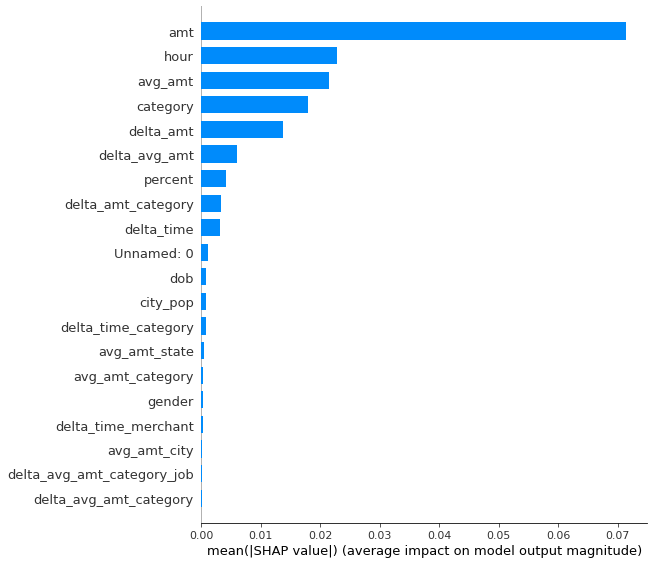

In [42]:
import shap
explainer = shap.TreeExplainer(xgb) 
shap_values = explainer.shap_values(xtest_transformed_complique) 
shap.summary_plot(shap_values, xtest_transformed_complique, plot_type="bar")


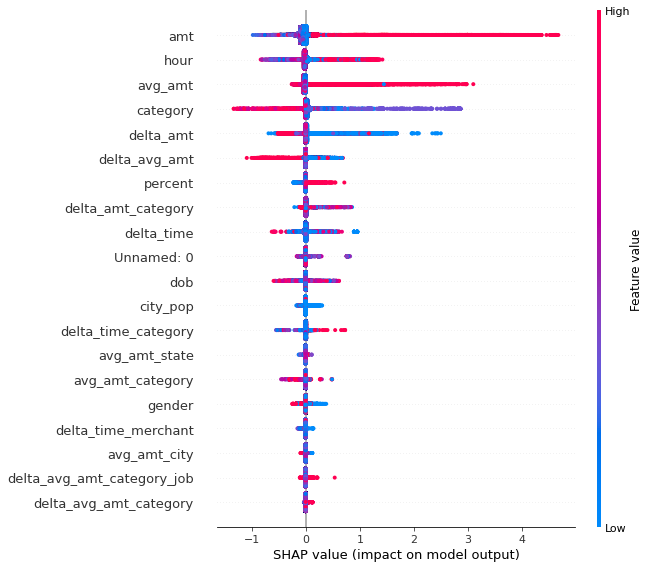

In [43]:
shap.summary_plot(shap_values, xtest_transformed_complique)



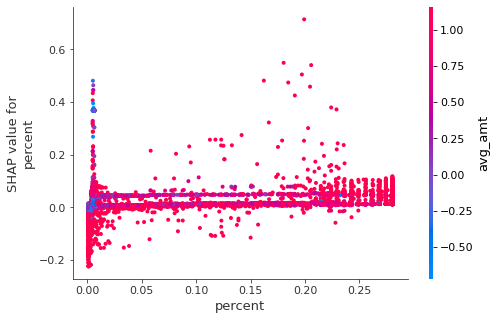

In [44]:
shap.dependence_plot("percent", shap_values, xtest_transformed_complique)



In [45]:
#network pour afficher 